In [ ]:
# Copyright 2025 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Imagen Product Recontext - Generation at Scale

<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/GoogleCloudPlatform/vertex-ai-creative-studio/blob/main/experiments/Imagen_Product_Recontext/imagen_product_recontext_at_scale.ipynb">
      <img width="32px" src="https://www.gstatic.com/pantheon/images/bigquery/welcome_page/colab-logo.svg" alt="Google Colaboratory logo"><br> Open in Colab
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogleCloudPlatform%vertex-ai-creative-studio%2Fmain%2Fexperiments%2FImagen_Product_Recontext%imagen_product_recontext_at_scale.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo"><br> Open in Colab Enterprise
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/GoogleCloudPlatform/vertex-ai-creative-studio/main/experiments/Imagen_Product_Recontext/imagen_product_recontext_at_scale.ipynb">
      <img src="https://www.gstatic.com/images/branding/gcpiconscolors/vertexai/v1/32px.svg" alt="Vertex AI logo"><br> Open in Vertex AI Workbench
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/bigquery/import?url=https://raw.githubusercontent.com/GoogleCloudPlatform/vertex-ai-creative-studio/main/experiments/Imagen_Product_Recontext/imagen_product_recontext_at_scale.ipynb">
      <img src="https://www.gstatic.com/images/branding/gcpiconscolors/bigquery/v1/32px.svg" alt="BigQuery Studio logo"><br> Open in BigQuery Studio
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://github.com/GoogleCloudPlatform/vertex-ai-creative-studio/blob/main/experiments/Imagen_Product_Recontext/imagen_product_recontext_at_scale.ipynb">
      <img width="32px" src="https://upload.wikimedia.org/wikipedia/commons/9/91/Octicons-mark-github.svg" alt="GitHub logo"><br> View on GitHub
    </a>
  </td>
</table>

<div style="clear: both;"></div>

| | |
|-|-|
|Author(s) | [Layolin Jesudhass](https://github.com/LUJ20), Isidro De Loera

## Imports

In [12]:
!pip install --upgrade --user google-cloud-aiplatform

from google import genai
from google.genai import types
from google.cloud import aiplatform, storage
from google.cloud.aiplatform.gapic import PredictResponse
from google.colab import auth

import base64
import io
import re
import timeit
import os
import json
from pathlib import Path
from typing import Any, Dict, List, Generator
from PIL import Image
import matplotlib.pyplot as plt

In [13]:
# --------------------------------------------------
# Authenticate your Colab session with GCP
from google.colab import auth
auth.authenticate_user()
print("Authenticated with Google Cloud")
# --------------------------------------------------


Authenticated with Google Cloud


## Helper Functions


In [14]:
#Core Helper Functions for GCS scanning and image display

# GCS‑scanning + debug prints

def get_mime_type(uri: str) -> str:
    ext = os.path.splitext(uri)[1].lower()
    if ext == ".png":
        return "image/png"
    elif ext in (".jpg", ".jpeg"):
        return "image/jpeg"
    else:
        raise ValueError(f"Unsupported extension: {ext}")

def discover_product_batches(input_gcs_uri: str) -> Generator[Dict[str, object], None, None]:
    """
    Yields dicts with:
      - product_folder (e.g. "product_5")
      - image_parts   (List[types.Part])
      - product_uris  (List[str])
    """
    m = re.match(r"gs://([^/]+)/(.+?)/?$", input_gcs_uri)
    if not m:
        raise ValueError(f"Invalid GCS URI: {input_gcs_uri}")
    bucket_name, base_prefix = m.groups()
    prefix = base_prefix.rstrip("/") + "/"
    client = storage.Client()
    print(f"🔍 Scanning bucket={bucket_name} prefix={prefix}")

    # fetch all blobs under prefix
    blobs = list(client.list_blobs(bucket_name, prefix=prefix))
    print(f"  • Found {len(blobs)} total objects under {prefix}")

    # group by first‑level folder name
    folder_map: Dict[str, List[storage.blob.Blob]] = {}
    for b in blobs:
        rel = b.name[len(prefix):]  # e.g. "product_5/thermos_1.png"
        parts = rel.split("/", 1)
        if len(parts) != 2:
            continue
        folder, filename = parts
        if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
            continue
        folder_map.setdefault(folder, []).append(b)

    print(f"  • Discovered product folders: {list(folder_map.keys())}")

    for folder, blob_list in folder_map.items():
        # sort & take up to 3
        blob_list.sort(key=lambda b: os.path.basename(b.name))
        blob_list = blob_list[:3]

        uris = [f"gs://{bucket_name}/{b.name}" for b in blob_list]
        parts = [
            types.Part(
                file_data=types.FileData(file_uri=uri, mime_type=get_mime_type(uri))
            )
            for uri in uris
        ]

        yield {
            "product_folder": folder,
            "image_parts":   parts,
            "product_uris":  uris,
        }

# Display helpers
def download_gcs_image_bytes(uri: str) -> bytes:
    m = re.match(r"gs://([^/]+)/(.*)", uri)
    if not m:
        raise ValueError(f"Invalid GCS URI: {uri}")
    bucket_name, obj = m.groups()
    client = storage.Client()
    return client.bucket(bucket_name).blob(obj).download_as_bytes()

def prediction_to_pil_image(pred: PredictResponse, size=(640, 640)) -> Image.Image:
    b64 = pred["bytesBase64Encoded"]
    data = base64.b64decode(b64)
    img = Image.open(io.BytesIO(data))
    img.thumbnail(size)
    return img

def display_row(items: List[Any], figsize=(12, 4)):
    if not items:
        print("No items to display.")
        return
    fig, axes = plt.subplots(1, len(items), figsize=figsize)
    if len(items) == 1:
        axes = [axes]
    for ax, it in zip(axes, items):
        if isinstance(it, Image.Image):
            ax.imshow(it)
        elif isinstance(it, dict) and "bytesBase64Encoded" in it:
            ax.imshow(prediction_to_pil_image(it))
        else:
            ax.text(0.5, 0.5, str(it), ha="center", va="center", wrap=True)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# generate() with fixed SafetySetting keyword args
def generate(image_parts: List[types.Part]) -> Dict[str, str]:
    import json, re
    from google import genai
    from google.genai import types

    client = genai.Client(
        vertexai=True,
        project="consumer-genai-experiments",
        location="global",
    )

    user_instr = types.Part.from_text(text="""
Analyze the provided images of a single product (up to 3). First, identify and describe the product in accurate, natural language: focus on material, color, shape, form, pattern, and distinctive design features.

Then, determine a visually appropriate and realistic background or scene where the product would naturally appear and look appealing. Base this on the product’s style and category — for example, place a desk lamp in a home office, or a sneaker in a modern studio.

DO NOT GENERATE PEOPLE/CHILDREN
Your output should be returned as a JSON object in the format below:
{
  "Prompt": "<rich description of product and proposed scene>",
  "product_description": "<just the product, no scene>"
}

Do not reference the original image’s background or lighting.
Do not use placeholders like “in a nice room” — be specific about the setting (e.g., “in a sunlit bohemian-style bedroom with woven textures and indoor plants”).
""")

    system_instr = types.Part.from_text(text="""
Role:
You are an expert visual analyst and prompt engineer for AI-based image generation. Your task is to analyze up to 3 input images of the same product, and generate a single, high-quality prompt suitable for AI-driven product image recontextualization.

Your objectives are twofold:

Describe the product accurately: Identify product category, form, material, texture, color, patterns, and notable design features.

Propose a compelling background/scene: Select a suitable environment in which the product would naturally and attractively appear — based on its likely usage, aesthetic, and category.

DO NOT GENERATE PEOPLE/CHILDREN

Input:
Up to 3 images of the same product (e.g., different angles or lighting).
No metadata, no background descriptions provided — just images.

Output Format:
Return a JSON object in this structure:
{
  "Prompt": "<natural language prompt for recontextualized image generation>",
  "product_description": "<just the product description, no scene>"
}""")

    contents = [ types.Content(role="user", parts=[user_instr, *image_parts]) ]
    config = types.GenerateContentConfig(
        temperature=0.2,
        top_p=0.95,
        max_output_tokens=8192,
        safety_settings=[
            types.SafetySetting(category="HARM_CATEGORY_HATE_SPEECH", threshold="OFF"),
            types.SafetySetting(category="HARM_CATEGORY_DANGEROUS_CONTENT", threshold="OFF"),
            types.SafetySetting(category="HARM_CATEGORY_SEXUALLY_EXPLICIT", threshold="OFF"),
            types.SafetySetting(category="HARM_CATEGORY_HARASSMENT", threshold="OFF"),
        ],
        system_instruction=[system_instr],
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    )

    output = ""
    for chunk in client.models.generate_content_stream(
        model="gemini-2.5-flash", contents=contents, config=config
    ):
        output += chunk.text

    clean = output.strip()
    clean = re.sub(r"^```(?:\w+)?\n","", clean)
    clean = re.sub(r"\n```$","", clean)
    return json.loads(clean)


# call_product_recontext()
def call_product_recontext(
    image_bytes_list=None,
    image_uris_list=None,
    prompt=None,
    product_description=None,
    disable_prompt_enhancement=True,
    sample_count=1,
    base_steps=None,
    safety_setting=None,
    person_generation=None,
) -> PredictResponse:
    inst: Dict[str, Any] = {"productImages": []}
    if image_uris_list:
        for uri in image_uris_list:
            inst["productImages"].append({"image": {"gcsUri": uri}})
    if not inst["productImages"]:
        raise ValueError("No product images provided.")
    if product_description:
        inst["productImages"][0]["productConfig"] = {"productDescription": product_description}
    if prompt:
        inst["prompt"] = prompt

    params = {"sampleCount": sample_count}
    if disable_prompt_enhancement: params["enhancePrompt"] = False
    if safety_setting:       params["safetySetting"] = safety_setting
    if person_generation:    params["personGeneration"] = person_generation
    if base_steps:           params["baseSteps"] = base_steps

    start = timeit.default_timer()
    resp = predict_client.predict(
        endpoint=model_endpoint,
        instances=[inst],
        parameters=params,
    )
    print(f"Recontext took {timeit.default_timer()-start:.2f}s")
    return resp

# save & upload helper
def save_and_upload_recontext_image(
    prediction_response,
    product_folder: str,
    output_bucket_name: str,
    output_base_prefix: str = "walmart/product_images_output",
    image_index: int = 0,
):
    out_pref = f"{output_base_prefix}/{product_folder}"

    if isinstance(prediction_response, list):
        prediction_response = prediction_response[0]
    img = prediction_to_pil_image(prediction_response)

    local = f"{product_folder}_output_{image_index}.jpg"
    img.convert("RGB").save(local, format="JPEG")
    print(f"Saved local: {local}")

    client = storage.Client()
    bucket = client.bucket(output_bucket_name)
    # ensure folder exists
    if not list(bucket.list_blobs(prefix=out_pref+"/")):
        bucket.blob(out_pref+"/").upload_from_string("", content_type="application/x-folder")
        print(f"🗂 Created folder gs://{output_bucket_name}/{out_pref}/")

    dst = bucket.blob(f"{out_pref}/{local}")
    dst.upload_from_filename(local, content_type="image/jpeg")
    print(f"Uploaded to gs://{output_bucket_name}/{out_pref}/{local}")

## Initialize Vertex AI Client

In [15]:
# Init clients
PROJECT_ID = "consumer-genai-experiments"
LOCATION   = "us-central1"

aiplatform.init(project=PROJECT_ID, location=LOCATION)
predict_client = aiplatform.gapic.PredictionServiceClient(
    client_options={"api_endpoint": f"{LOCATION}-aiplatform.googleapis.com"}
)
model_endpoint = (
    f"projects/{PROJECT_ID}/locations/{LOCATION}"
    + "/publishers/google/models/imagen-product-recontext-preview-06-30"
)
print("Prediction client ready")


Prediction client ready


# Sequential Run


Process started at: 2025-07-30 15:17:13
🔍 Scanning bucket=id_test_bucket prefix=walmart/product_images_input/
  • Found 63 total objects under walmart/product_images_input/
  • Discovered product folders: ['product_1', 'product_10', 'product_11', 'product_12', 'product_13', 'product_14', 'product_15', 'product_16', 'product_17', 'product_18', 'product_19', 'product_2', 'product_20', 'product_3', 'product_4', 'product_5', 'product_6', 'product_7', 'product_8', 'product_9']

Total product folders discovered: 20

=== Processing product_1 ===


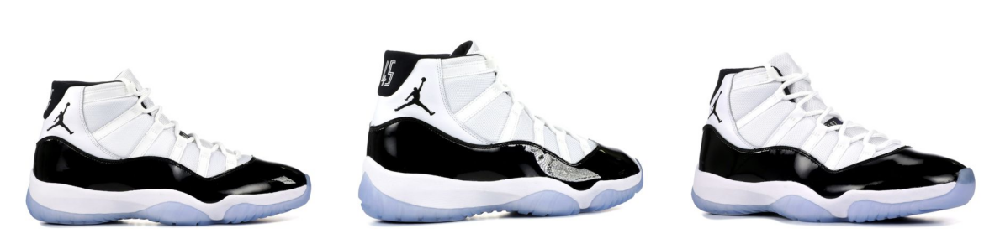

Prompt: A high-top athletic sneaker, primarily white with a prominent black patent leather mudguard wrapping around the base. The upper features white mesh and leather panels, with white laces. A black Jumpman logo is visible on the side near the ankle. The sole is white with a translucent icy blue outsole. The sneaker is placed on a polished hardwood basketball court, with subtle court lines visible, under bright arena lighting.
Desc:   A high-top athletic sneaker, primarily white with a prominent black patent leather mudguard wrapping around the base. The upper features white mesh and leather panels, with white laces. A black Jumpman logo is visible on the side near the ankle. The sole is white with a translucent icy blue outsole.
Recontext took 11.76s


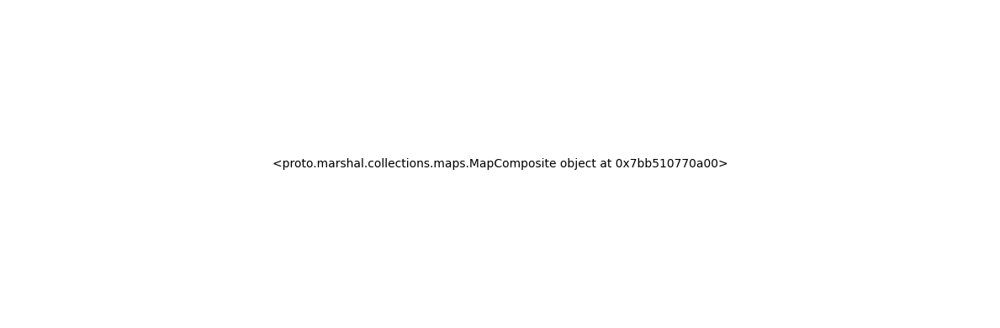

Saved local: product_1_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_1/product_1_output_0.jpg

=== Processing product_10 ===


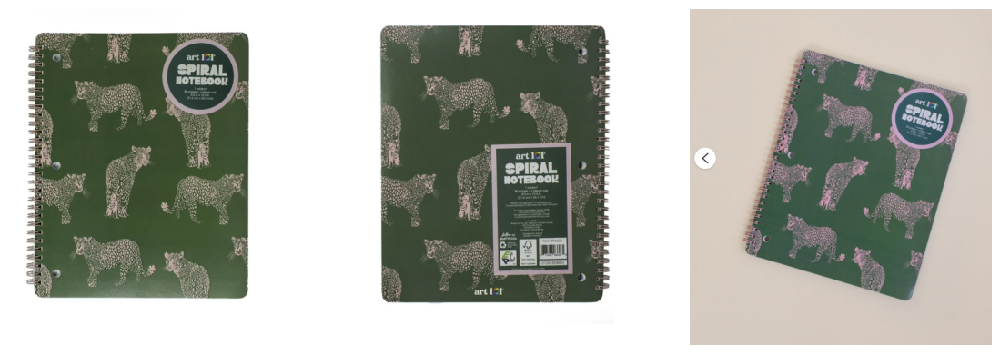

Prompt: A spiral-bound notebook with a dark green cover featuring a repeating pattern of stylized light pink leopards. The notebook has a rose gold colored spiral binding and three punched holes along the left edge. It is displayed open on a light-colored wooden desk, surrounded by other stationery items like pens, pencils, and a small potted succulent, bathed in soft, natural light from a nearby window.
Desc:   A spiral-bound notebook with a dark green cover featuring a repeating pattern of stylized light pink leopards. The notebook has a rose gold colored spiral binding and three punched holes along the left edge.
Recontext took 14.17s


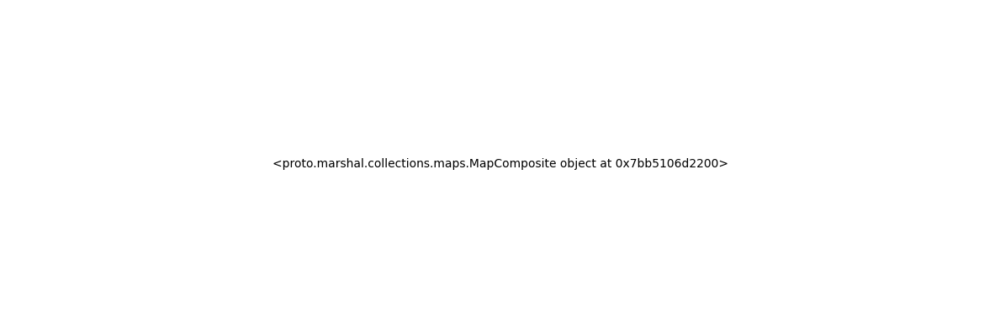

Saved local: product_10_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_10/product_10_output_0.jpg

=== Processing product_11 ===


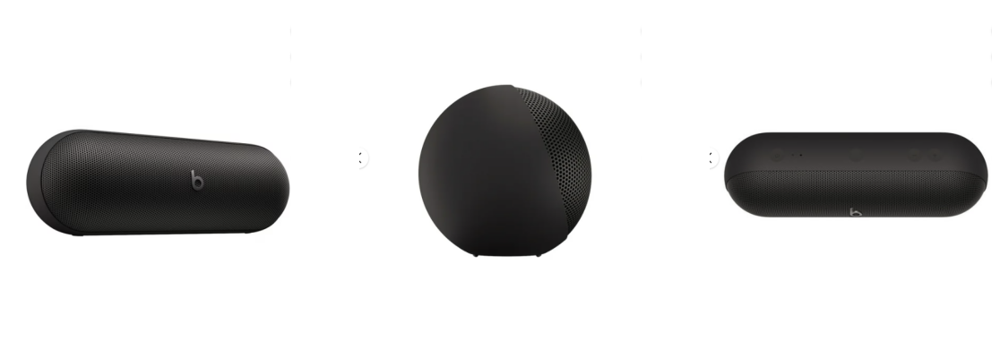

Prompt: A sleek, matte black portable Bluetooth speaker with an elongated, rounded oval shape and a perforated metal grille covering the front and sides, featuring a subtle 'b' logo in the center. The speaker is placed on a modern, minimalist wooden desk in a sunlit home office, with a potted succulent and a stack of design books nearby, creating a clean and sophisticated aesthetic.
Desc:   A sleek, matte black portable Bluetooth speaker with an elongated, rounded oval shape and a perforated metal grille covering the front and sides, featuring a subtle 'b' logo in the center.
Recontext took 12.14s


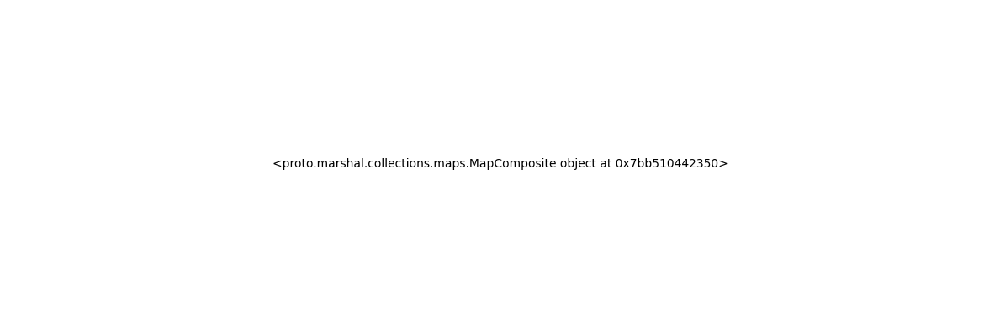

Saved local: product_11_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_11/product_11_output_0.jpg

=== Processing product_12 ===


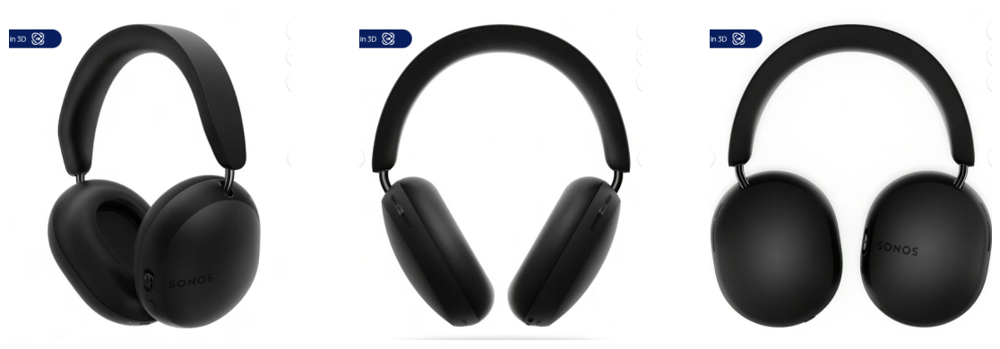

Prompt: A pair of sleek, modern over-ear headphones in matte black, featuring a minimalist design with smooth, rounded earcups and a padded headband. The 'SONOS' logo is subtly debossed on the side of one earcup. The headphones are resting on a polished concrete desk in a contemporary home office, with a minimalist white monitor and a small, sculptural desk plant in the background, bathed in soft, natural light from a large window.
Desc:   A pair of sleek, modern over-ear headphones in matte black, featuring a minimalist design with smooth, rounded earcups and a padded headband. The 'SONOS' logo is subtly debossed on the side of one earcup.
Recontext took 14.46s


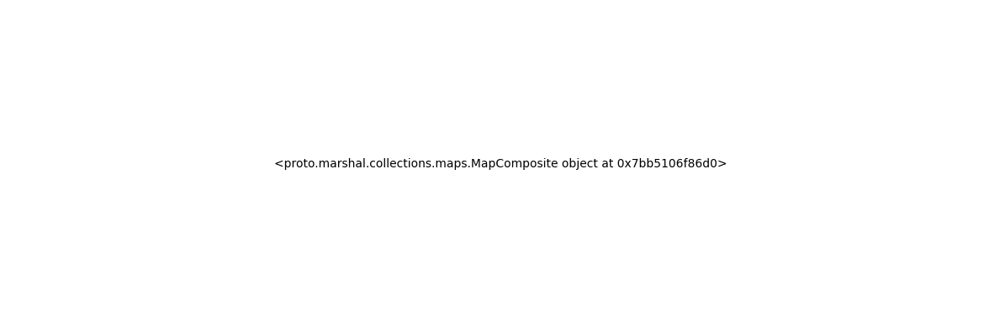

Saved local: product_12_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_12/product_12_output_0.jpg

=== Processing product_13 ===


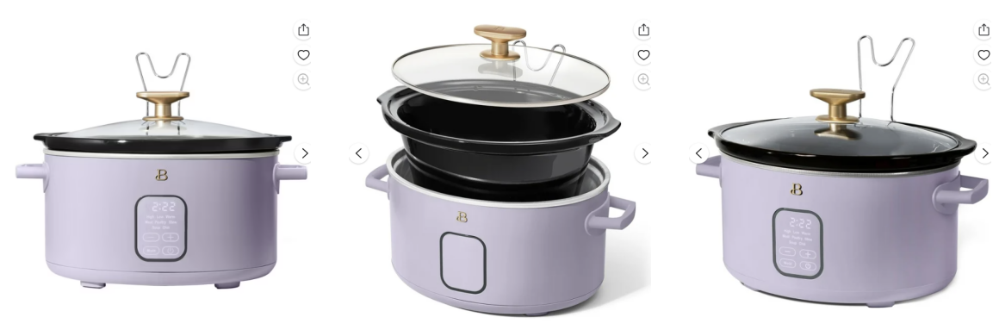

Prompt: A modern, oval-shaped slow cooker in a matte lavender finish, featuring integrated side handles and a digital display panel with touch controls. It has a black ceramic insert and a clear glass lid with a gold-toned knob and a chrome wire lid rest. The slow cooker is positioned on a light wood countertop in a minimalist kitchen with white subway tile backsplash and subtle natural light streaming in from a window, surrounded by fresh herbs in small ceramic pots.
Desc:   An oval-shaped slow cooker with a matte lavender exterior, integrated side handles, and a digital display panel with touch controls. It includes a black ceramic insert and a clear glass lid topped with a gold-toned knob and a chrome wire lid rest.
Recontext took 13.63s


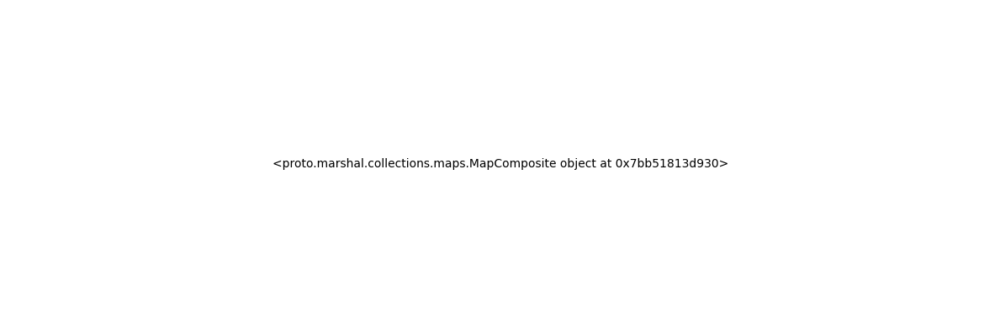

Saved local: product_13_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_13/product_13_output_0.jpg

=== Processing product_14 ===


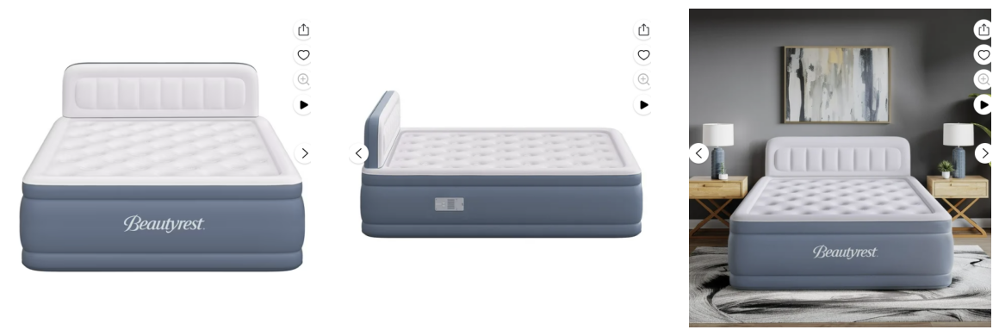

Prompt: A large, rectangular inflatable air mattress with a built-in headboard, featuring a two-tone design with a light gray top sleeping surface and a darker blue-gray base. The top surface has a quilted or tufted appearance with circular indentations, while the headboard is vertically ribbed. The brand name 'Beautyrest' is printed in white script on the side of the base. The air mattress is placed in a modern guest bedroom with light-colored hardwood floors, a minimalist nightstand with a small plant, and soft, indirect lighting from a window.
Desc:   A large, rectangular inflatable air mattress with a built-in headboard, featuring a two-tone design with a light gray top sleeping surface and a darker blue-gray base. The top surface has a quilted or tufted appearance with circular indentations, while the headboard is vertically ribbed. The brand name 'Beautyrest' is printed in white script on the side of the base.
Recontext took 13.30s


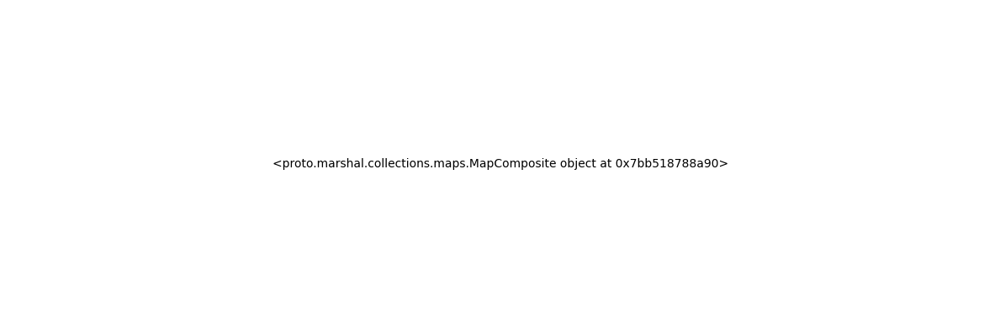

Saved local: product_14_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_14/product_14_output_0.jpg

=== Processing product_15 ===


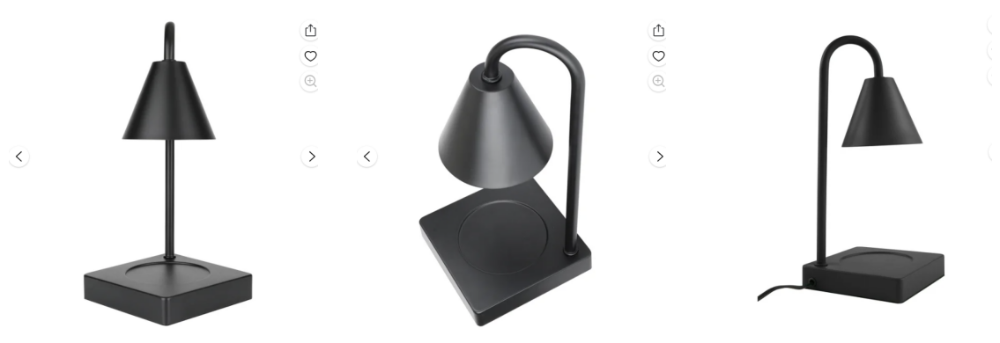

Prompt: A sleek, modern black metal candle warmer with a conical shade and a minimalist square base, featuring a circular indentation for a candle. The warmer is positioned on a polished dark wood nightstand in a contemporary bedroom, with soft, warm ambient lighting, a neatly made bed with neutral-toned linens, and a subtle decorative plant in the background.
Desc:   A sleek, modern black metal candle warmer with a conical shade and a minimalist square base, featuring a circular indentation for a candle. The design is clean and contemporary, with a matte finish.
Recontext took 12.62s


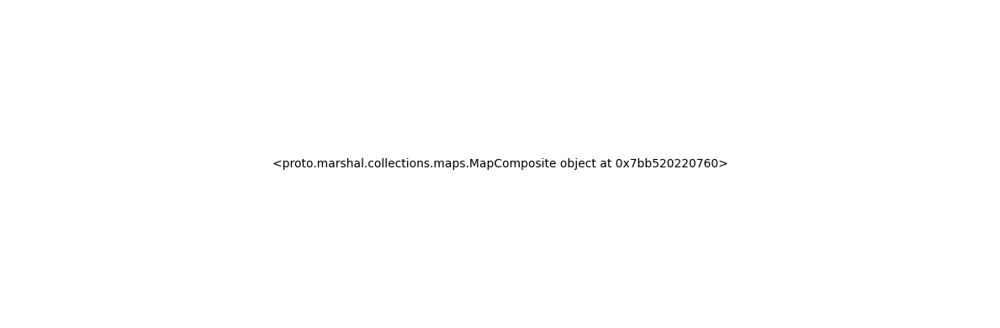

Saved local: product_15_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_15/product_15_output_0.jpg

=== Processing product_16 ===


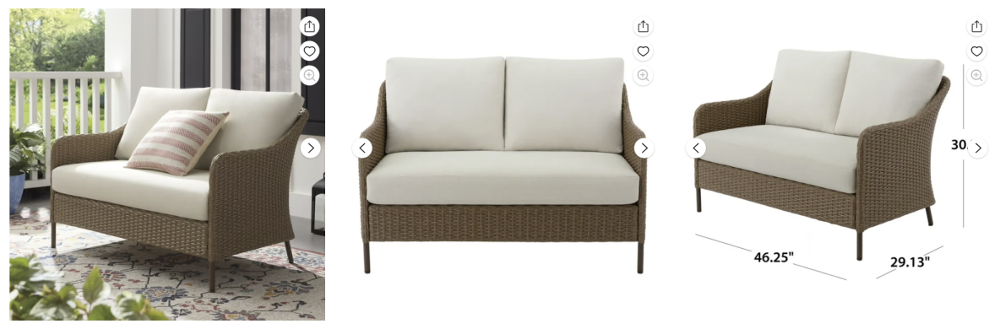

Prompt: A two-seater outdoor loveseat featuring a durable, weather-resistant brown wicker frame with a tightly woven texture. It has a slightly curved back and armrests, and is supported by four slender, dark brown metal legs. The loveseat is fitted with plush, off-white cushions on the seat and back, providing a comfortable contrast to the wicker. The loveseat is placed on a spacious, sun-drenched patio with terracotta tiles, surrounded by lush green potted plants and a vibrant bougainvillea vine climbing a nearby wall, creating a serene and inviting outdoor living space.
Desc:   A two-seater outdoor loveseat featuring a durable, weather-resistant brown wicker frame with a tightly woven texture. It has a slightly curved back and armrests, and is supported by four slender, dark brown metal legs. The loveseat is fitted with plush, off-white cushions on the seat and back, providing a comfortable contrast to the wicker.
Recontext took 13.81s


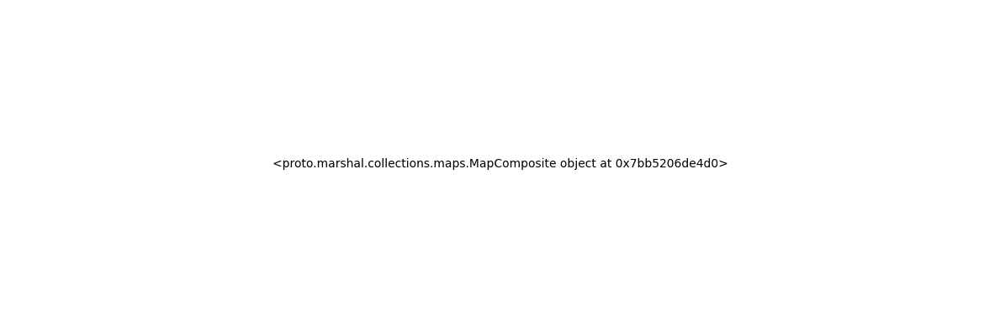

Saved local: product_16_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_16/product_16_output_0.jpg

=== Processing product_17 ===


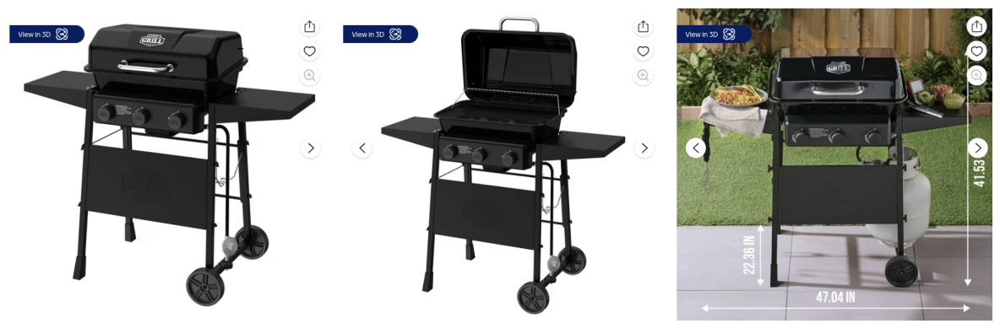

Prompt: A compact, black gas grill with a rectangular body, two side tables, and two wheels for portability. It features a hinged lid with a silver handle, two control knobs on the front panel, and a lower shelf. The grill is positioned on a spacious outdoor patio with natural stone pavers, surrounded by lush green landscaping and a wooden fence in the background. Sunlight casts a warm glow on the scene, highlighting the grill's matte finish.
Desc:   A compact, black gas grill with a rectangular body, two side tables, and two wheels for portability. It features a hinged lid with a silver handle, two control knobs on the front panel, and a lower shelf.
Recontext took 11.74s


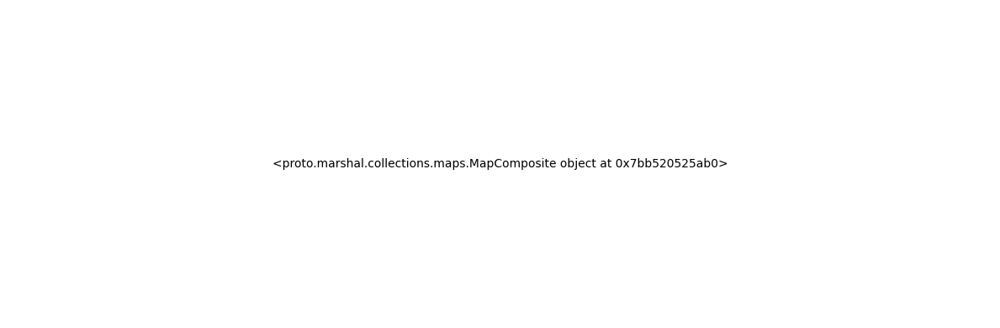

Saved local: product_17_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_17/product_17_output_0.jpg

=== Processing product_18 ===


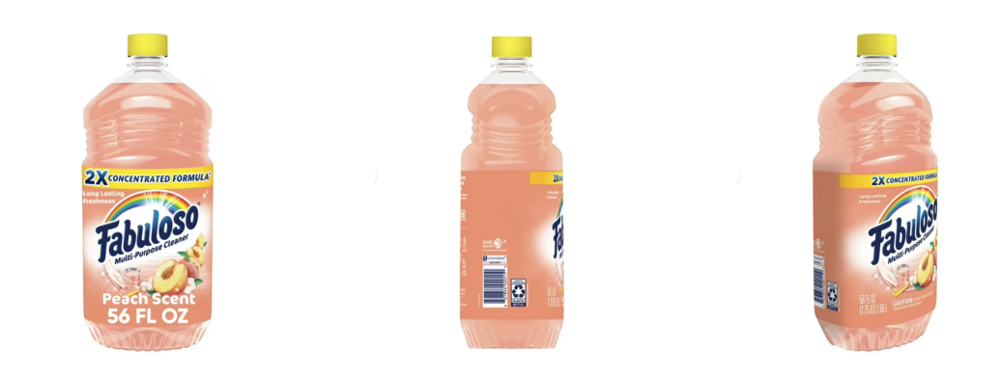

Prompt: A large, clear plastic bottle of Fabuloso multi-purpose cleaner, filled with a translucent peach-colored liquid. The bottle has a yellow screw-top cap and a ribbed neck for grip. The label is predominantly peach-colored with a rainbow graphic and text indicating 'Peach Scent' and '2X Concentrated Formula'. The bottle is placed on a clean, white kitchen countertop next to a stainless steel sink, with a subtle reflection of natural light from a window.
Desc:   A large, clear plastic bottle of Fabuloso multi-purpose cleaner, filled with a translucent peach-colored liquid. The bottle has a yellow screw-top cap and a ribbed neck for grip. The label is predominantly peach-colored with a rainbow graphic and text indicating 'Peach Scent' and '2X Concentrated Formula'.
Recontext took 13.79s


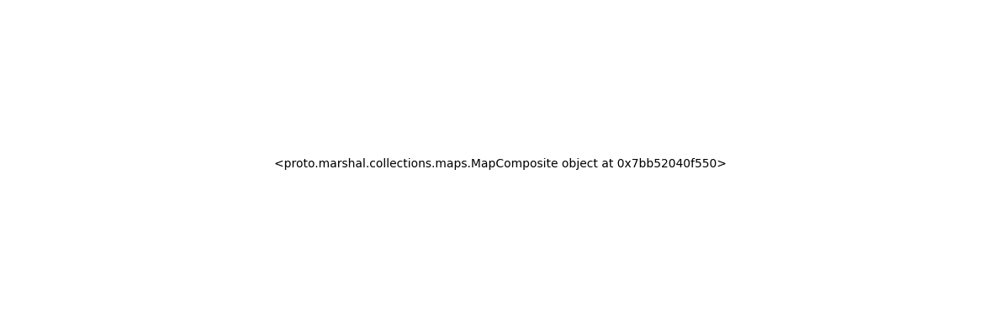

Saved local: product_18_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_18/product_18_output_0.jpg

=== Processing product_19 ===


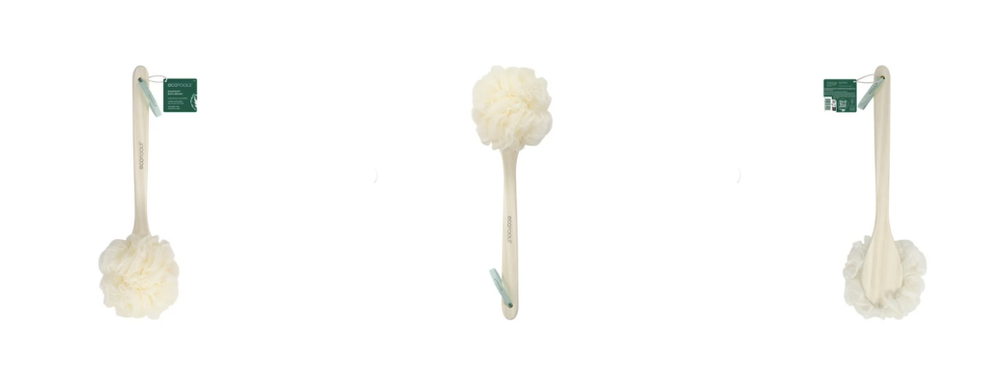

Prompt: A long-handled bath brush with a light-colored, smooth wooden handle and a large, fluffy, cream-colored mesh loofah head. The handle is slender and slightly curved, with the brand name 'ecotools' subtly debossed along its length. The loofah is full and soft, made of a finely woven mesh material. The brush is hanging on a sleek, minimalist towel rack in a modern, spa-like bathroom with white subway tiles and soft, diffused natural light.
Desc:   A long-handled bath brush with a light-colored, smooth wooden handle and a large, fluffy, cream-colored mesh loofah head. The handle is slender and slightly curved, with the brand name 'ecotools' subtly debossed along its length. The loofah is full and soft, made of a finely woven mesh material.
Recontext took 11.16s


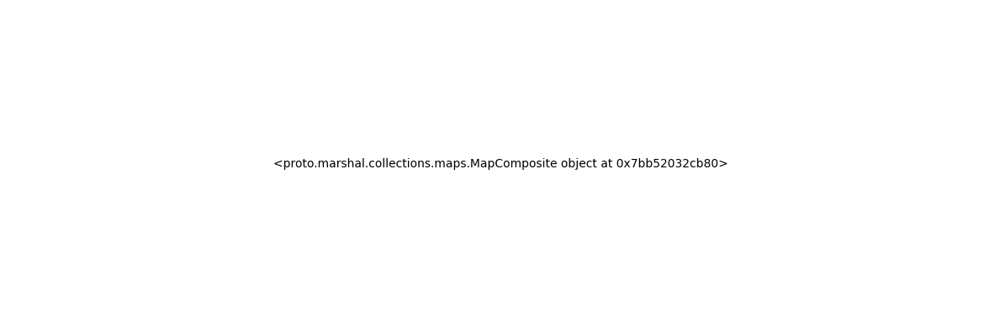

Saved local: product_19_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_19/product_19_output_0.jpg

=== Processing product_2 ===


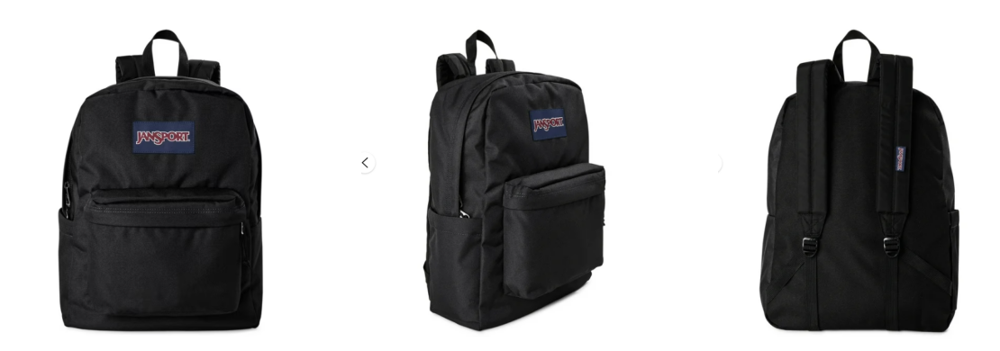

Prompt: A classic black Jansport backpack, made of durable polyester fabric with a slightly textured finish. It features a main compartment, a smaller front utility pocket with a zipper closure, and a side water bottle pocket. The iconic rectangular Jansport logo patch, with 'JANSPORT' in white text on a red and blue background, is prominently displayed on the front. The backpack has padded shoulder straps and a top grab handle. The backpack is placed on a wooden bench in a vibrant, sunlit park setting, with lush green trees and a paved pathway in the background, suggesting a casual outdoor activity.
Desc:   A classic black Jansport backpack, made of durable polyester fabric with a slightly textured finish. It features a main compartment, a smaller front utility pocket with a zipper closure, and a side water bottle pocket. The iconic rectangular Jansport logo patch, with 'JANSPORT' in white text on a red and blue background, is prominently displayed on the front. The backpack has padde

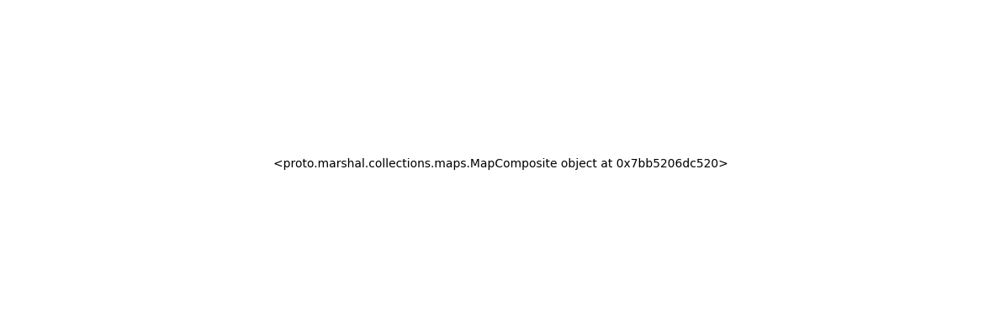

Saved local: product_2_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_2/product_2_output_0.jpg

=== Processing product_20 ===


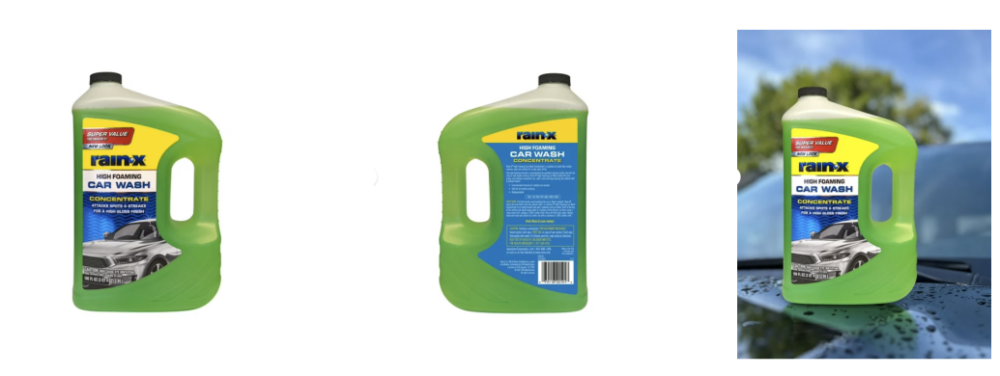

Prompt: A large, bright green plastic jug of Rain-X High Foaming Car Wash Concentrate, featuring a black screw-top lid and an integrated handle. The front label is yellow and blue, displaying product information and a graphic of a shiny silver car. The jug is positioned on the hood of a freshly washed, dark-colored car, with water droplets visible on the surface, under a clear blue sky with soft green foliage in the background, suggesting an outdoor car washing scene.
Desc:   A large, bright green plastic jug of Rain-X High Foaming Car Wash Concentrate, featuring a black screw-top lid and an integrated handle. The front label is yellow and blue, displaying product information and a graphic of a shiny silver car.
Recontext took 15.51s


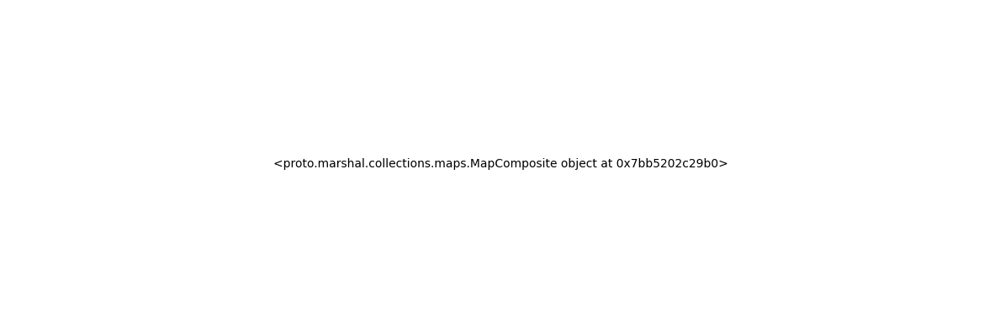

Saved local: product_20_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_20/product_20_output_0.jpg

=== Processing product_3 ===


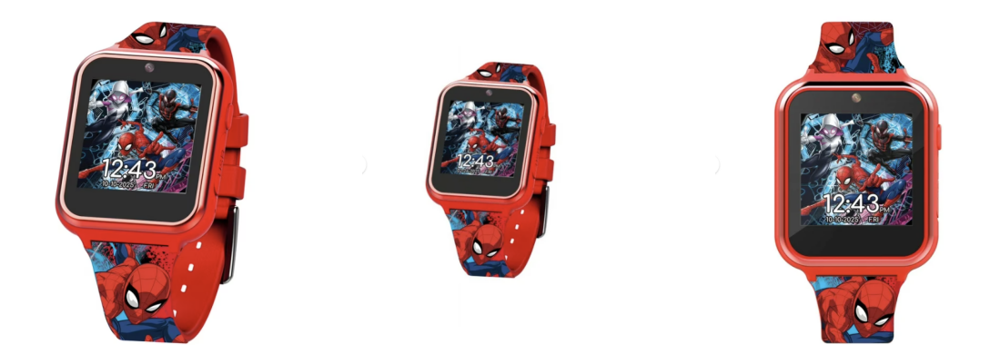

Prompt: A vibrant red square-faced kids' smartwatch with a glossy finish and a black screen displaying a colorful Spider-Man themed wallpaper. The watch features a red silicone strap adorned with dynamic Spider-Man character graphics in blue, red, and black. The watch has a small camera lens above the screen and several buttons on its sides. The product is displayed on a brightly lit, organized desk in a child's bedroom, surrounded by superhero action figures and comic books, with a colorful world map on the wall in the background.
Desc:   A vibrant red square-faced kids' smartwatch with a glossy finish and a black screen displaying a colorful Spider-Man themed wallpaper. The watch features a red silicone strap adorned with dynamic Spider-Man character graphics in blue, red, and black. The watch has a small camera lens above the screen and several buttons on its sides.
Recontext took 14.69s


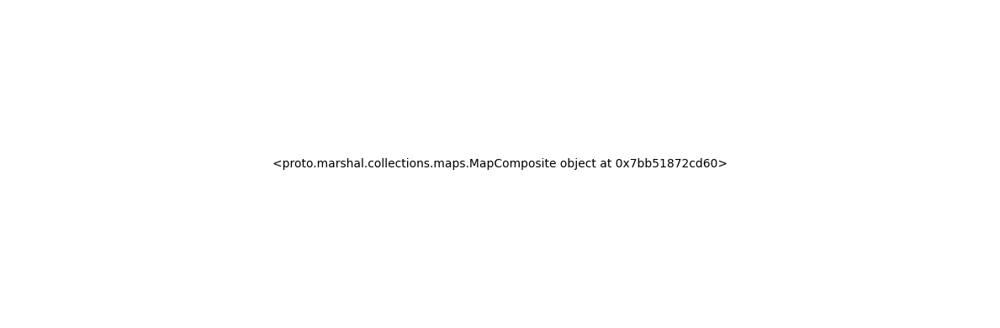

Saved local: product_3_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_3/product_3_output_0.jpg

=== Processing product_4 ===


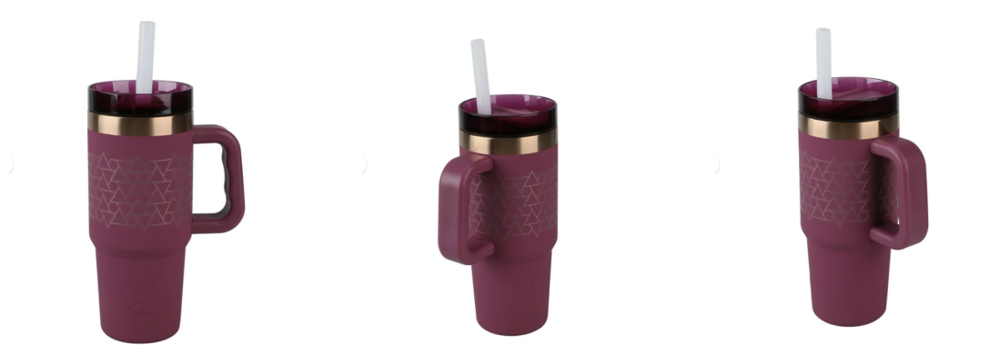

Prompt: A large, insulated tumbler with a matte plum-colored body and a sturdy, integrated handle. It features a geometric pattern of interlocking triangles in a lighter metallic shade around its upper circumference. The tumbler has a rose gold-toned metallic band just below a translucent dark purple lid, through which a white silicone straw protrudes. The tumbler is placed on a rustic wooden picnic table in a sun-dappled park, surrounded by lush green foliage and a few scattered autumn leaves, with a soft-focus background of distant trees and a clear blue sky.
Desc:   A large, insulated tumbler with a matte plum-colored body and a sturdy, integrated handle. It features a geometric pattern of interlocking triangles in a lighter metallic shade around its upper circumference. The tumbler has a rose gold-toned metallic band just below a translucent dark purple lid, through which a white silicone straw protrudes.
Recontext took 13.36s


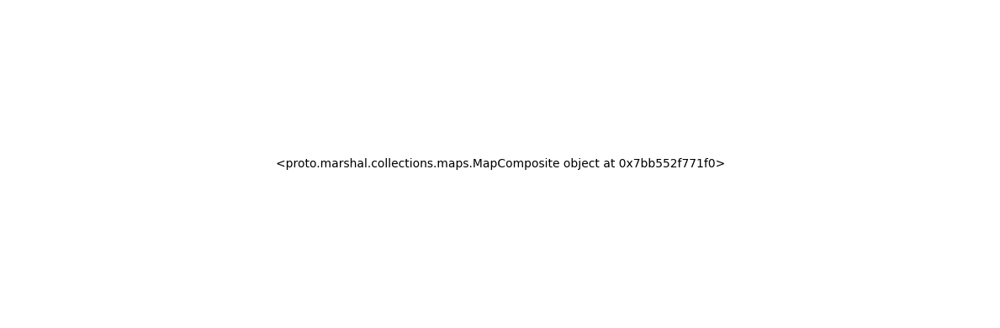

Saved local: product_4_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_4/product_4_output_0.jpg

=== Processing product_5 ===


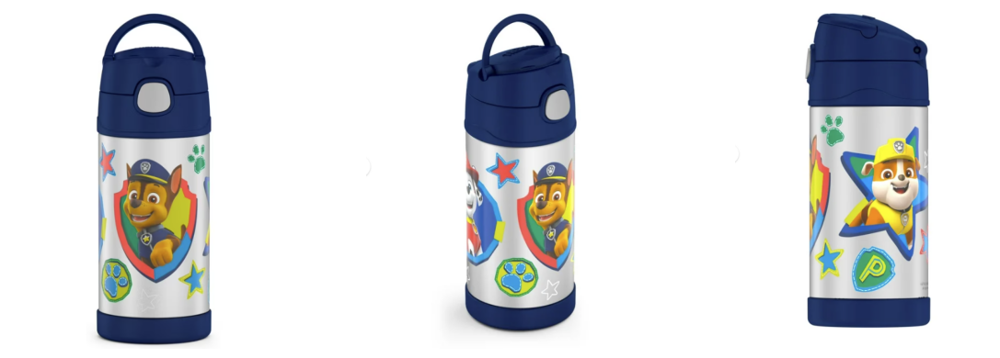

Prompt: A stainless steel insulated water bottle with a dark blue plastic lid and base, featuring a vibrant 'Paw Patrol' character graphic wrap. The graphic includes characters like Chase, Marshall, and Rubble, along with various colorful paw prints and stars, set against a metallic silver background. The lid has a small, integrated carrying handle and a push-button opening mechanism. The bottle is placed on a picnic blanket in a sunny park, surrounded by green grass and a few scattered colorful toys, suggesting a playful outdoor setting.
Desc:   A stainless steel insulated water bottle with a dark blue plastic lid and base, featuring a vibrant 'Paw Patrol' character graphic wrap. The graphic includes characters like Chase, Marshall, and Rubble, along with various colorful paw prints and stars, set against a metallic silver background. The lid has a small, integrated carrying handle and a push-button opening mechanism.
Recontext took 11.06s


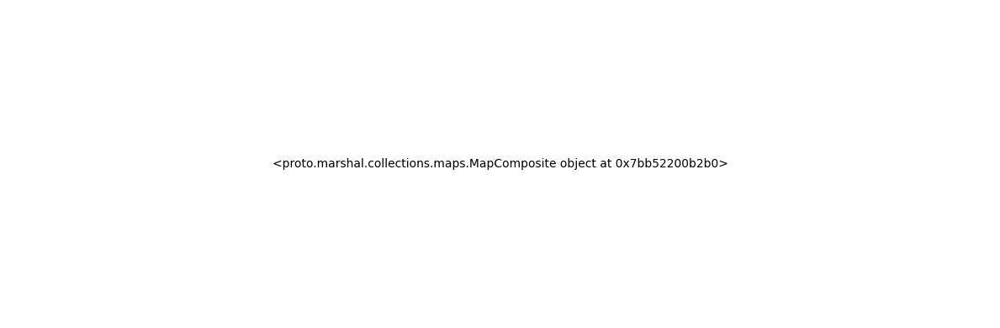

Saved local: product_5_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_5/product_5_output_0.jpg

=== Processing product_6 ===


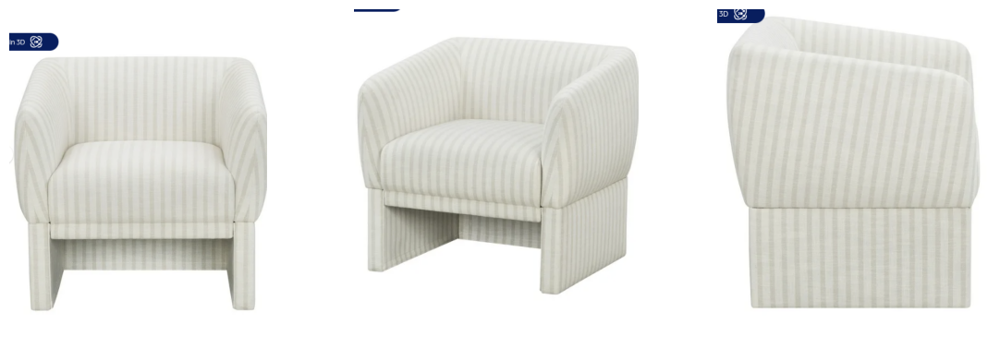

Prompt: A contemporary club chair upholstered in a light beige and off-white striped fabric, featuring a rounded back and arms that flow seamlessly into the seat, and a recessed plinth base. The chair is positioned in a minimalist living room with natural light streaming through large windows, a light oak wood floor, and a large, abstract art piece on the wall.
Desc:   A contemporary club chair upholstered in a light beige and off-white striped fabric, featuring a rounded back and arms that flow seamlessly into the seat, and a recessed plinth base.
Recontext took 16.19s


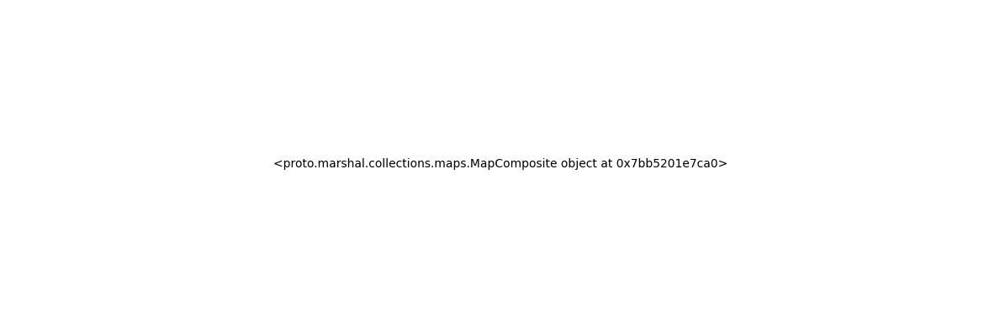

Saved local: product_6_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_6/product_6_output_0.jpg

=== Processing product_7 ===


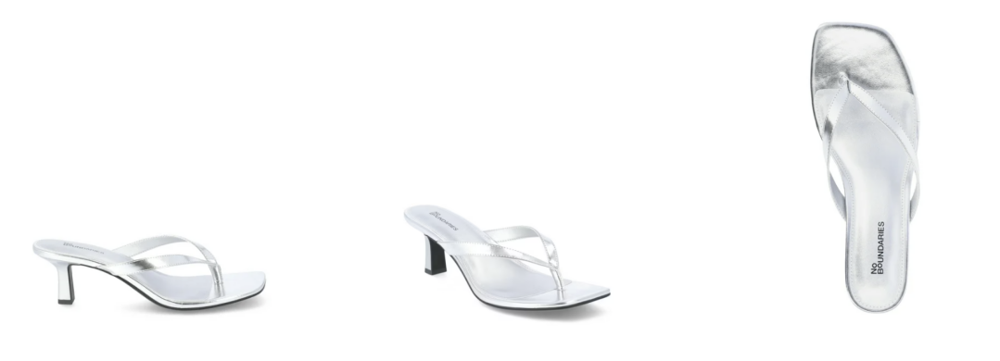

Prompt: A single silver metallic flip-flop style high-heel sandal with a square toe and a flared, block heel, featuring thin straps, resting on a polished concrete floor in a minimalist, modern art gallery setting with soft, diffused lighting.
Desc:   A single silver metallic flip-flop style high-heel sandal with a square toe and a flared, block heel, featuring thin straps.
Recontext took 19.32s


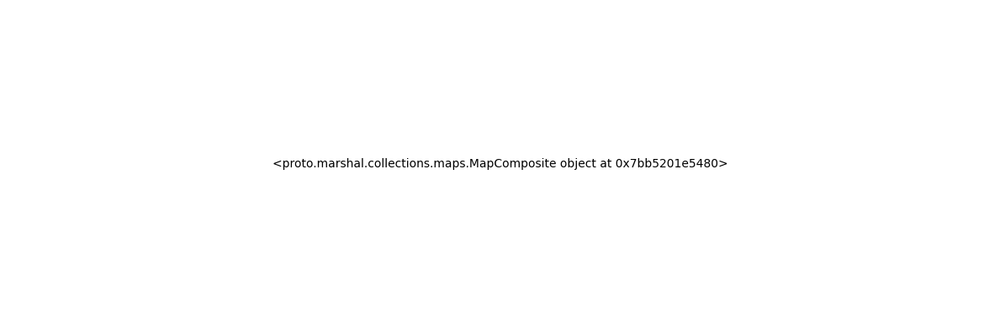

Saved local: product_7_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_7/product_7_output_0.jpg

=== Processing product_8 ===


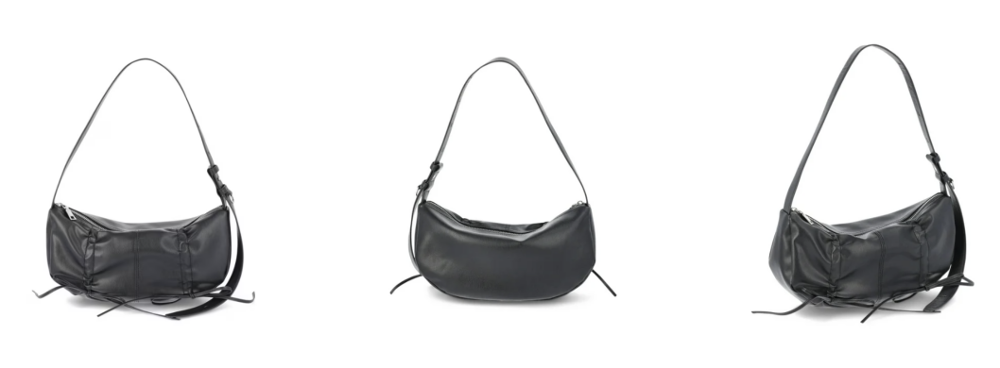

Prompt: A sleek, black faux leather shoulder bag with a crescent moon shape and a ruched, gathered body, featuring a silver-toned zipper closure and an adjustable strap, resting on a minimalist concrete bench in a modern art gallery with soft, diffused natural light filtering through large windows.
Desc:   A sleek, black faux leather shoulder bag with a crescent moon shape and a ruched, gathered body, featuring a silver-toned zipper closure and an adjustable strap.
Recontext took 13.22s


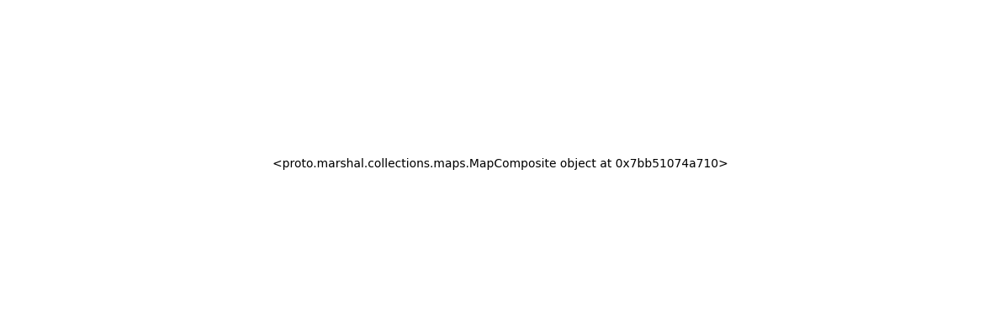

Saved local: product_8_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_8/product_8_output_0.jpg

=== Processing product_9 ===


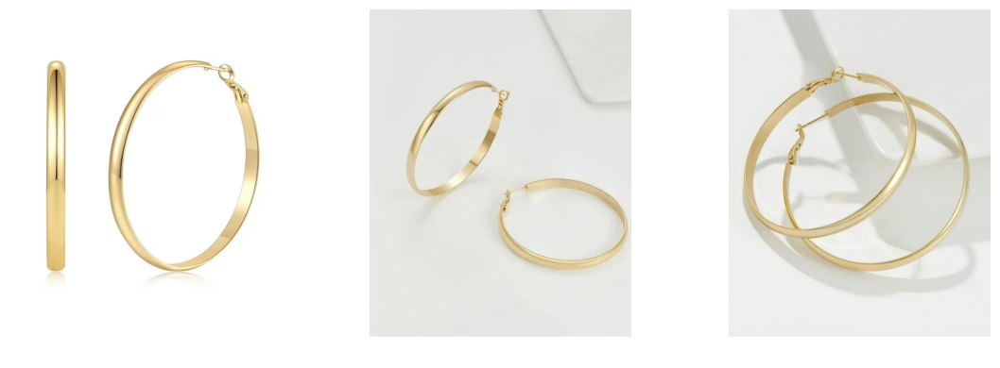

Prompt: A pair of elegant, polished gold-tone hoop earrings with a flat, wide band and a smooth, reflective surface, featuring a classic hinged closure. The earrings are displayed on a luxurious velvet jewelry tray in a warm, inviting bedroom setting with soft, diffused natural light filtering through sheer curtains, highlighting the earrings' lustrous finish.
Desc:   A pair of elegant, polished gold-tone hoop earrings with a flat, wide band and a smooth, reflective surface, featuring a classic hinged closure.
Recontext took 12.61s


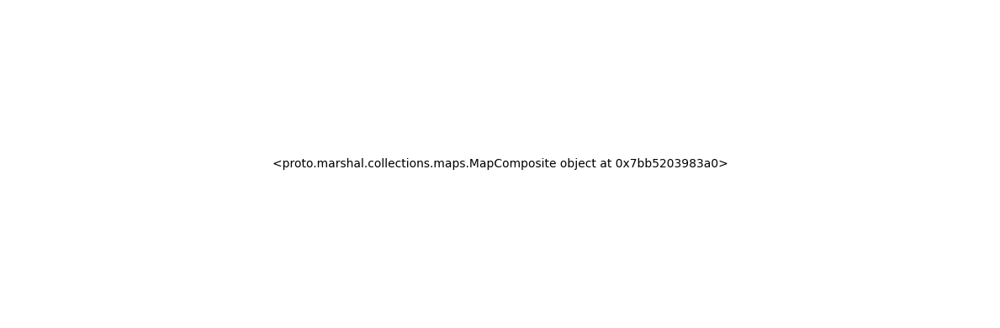

Saved local: product_9_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_9/product_9_output_0.jpg

Process completed at: 2025-07-30 15:22:57
⏱Total time taken: 0:05:43.782812


In [16]:
# Sequential one by one

from datetime import datetime
import io
from PIL import Image

# Define constants
INPUT_PREFIX = "gs://id_test_bucket/walmart/product_images_input"
OUTPUT_BUCKET = "id_test_bucket"

# Start time
start_time = datetime.now()
print(f"\nProcess started at: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")

# Discover batches
batches = list(discover_product_batches(INPUT_PREFIX))
print(f"\nTotal product folders discovered: {len(batches)}")

if not batches:
    raise RuntimeError("No product batches found—check your GCS path & permissions!")

# Process each batch
for batch in batches:
    print(f"\n=== Processing {batch['product_folder']} ===")

    # Preview
    imgs = [Image.open(io.BytesIO(download_gcs_image_bytes(u))) for u in batch["product_uris"]]
    display_row(imgs)

    # Generate prompt & description
    gen = generate(batch["image_parts"])
    print("Prompt:", gen["Prompt"])
    print("Desc:  ", gen["product_description"])

    # Recontextualize
    resp = call_product_recontext(
        prompt=gen["Prompt"],
        product_description=gen["product_description"],
        image_uris_list=batch["product_uris"],
        disable_prompt_enhancement=False,
        sample_count=1,
        safety_setting="block_low_and_above",
        person_generation="allow_adult",
    )

    # Display & upload
    preds = list(resp.predictions)
    display_row(preds)
    for i, p in enumerate(preds):
        save_and_upload_recontext_image(
            p,
            batch["product_folder"],
            OUTPUT_BUCKET,
            image_index=i
        )

# End time
end_time = datetime.now()
duration = end_time - start_time
print(f"\nProcess completed at: {end_time.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"⏱Total time taken: {duration}")


# Parallel threads


🔄 Process started at: 2025-07-30 15:22:57
🔍 Scanning bucket=id_test_bucket prefix=walmart/product_images_input/
  • Found 63 total objects under walmart/product_images_input/
  • Discovered product folders: ['product_1', 'product_10', 'product_11', 'product_12', 'product_13', 'product_14', 'product_15', 'product_16', 'product_17', 'product_18', 'product_19', 'product_2', 'product_20', 'product_3', 'product_4', 'product_5', 'product_6', 'product_7', 'product_8', 'product_9']

Total product folders discovered: 20

=== Processing product_1 ===

=== Processing product_10 ===

=== Processing product_11 ===

=== Processing product_12 ===

=== Processing product_13 ===


<ipython-input-14-0a53c2327042>:97: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


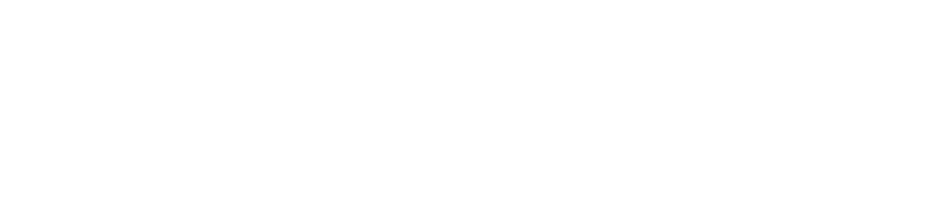

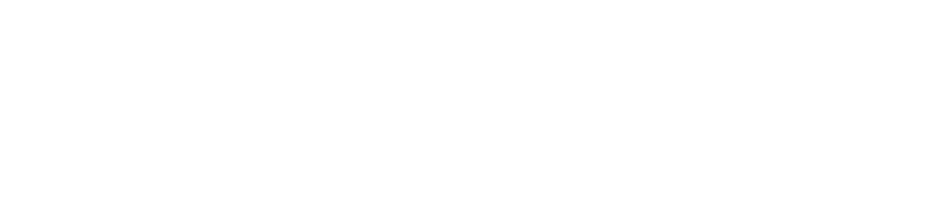

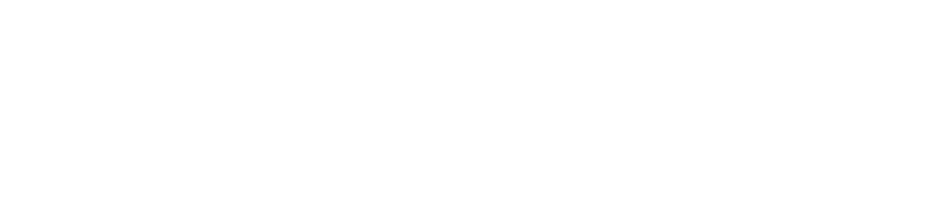

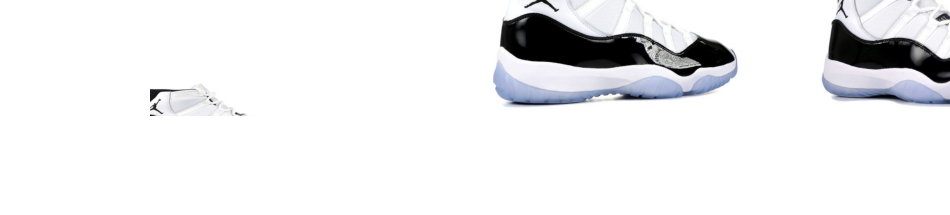

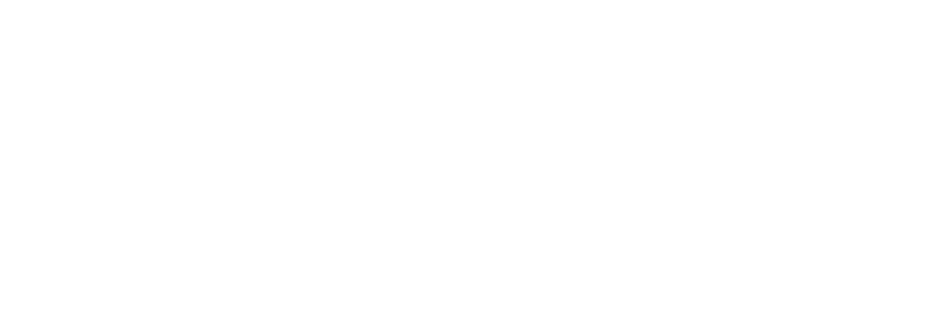

...

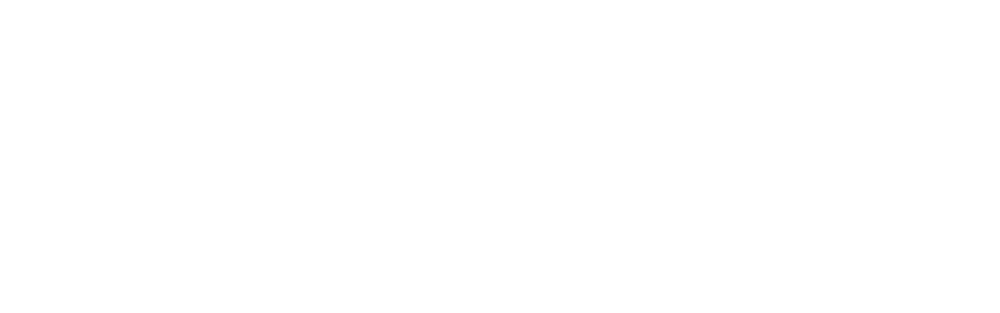

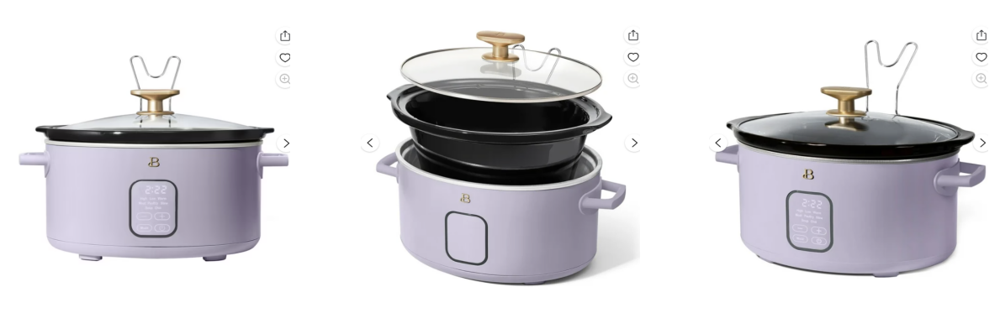

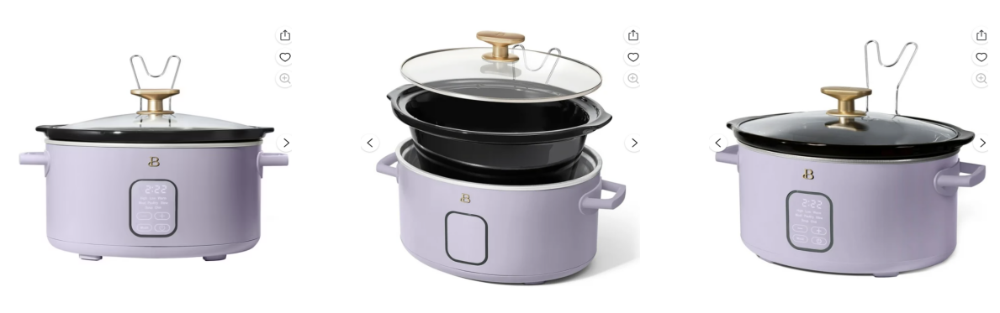

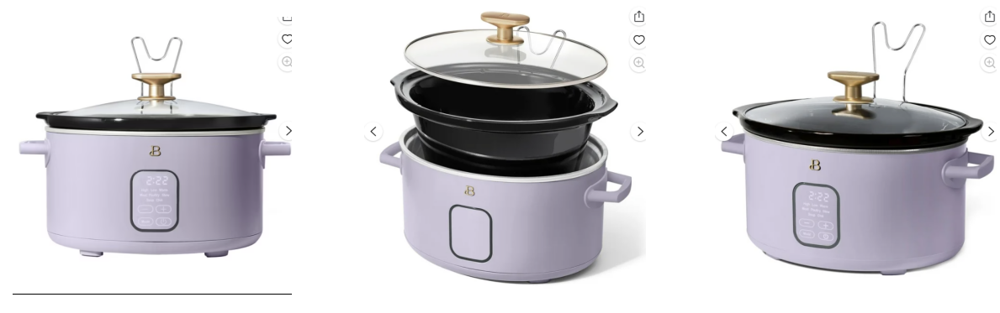

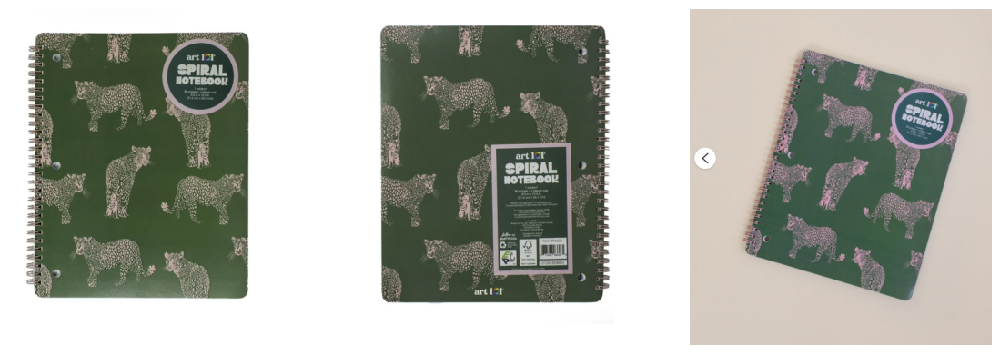

Prompt: A sleek, matte black portable Bluetooth speaker with an elongated, rounded cylindrical shape and a perforated metal grille covering the front and sides, featuring a subtle 'b' logo in the center. The speaker is positioned on a minimalist, light-colored wooden desk in a modern home office, with a subtle glow from a window illuminating the scene, and a few green plants in the background.
Desc:   A sleek, matte black portable Bluetooth speaker with an elongated, rounded cylindrical shape and a perforated metal grille covering the front and sides, featuring a subtle 'b' logo in the center.
Prompt: A high-top athletic sneaker, primarily white and black, featuring a prominent glossy black patent leather mudguard that wraps around the entire base of the shoe. The upper is constructed from white mesh and leather, with white laces and a black tongue. A black Jumpman logo is visible on the side ankle. The sole is white with a translucent icy blue outsole. The sneaker is displayed on a po

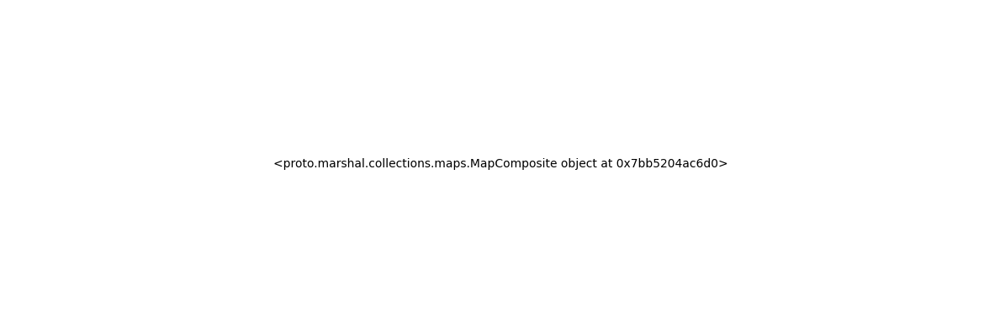

Saved local: product_11_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_11/product_11_output_0.jpg

=== Processing product_14 ===


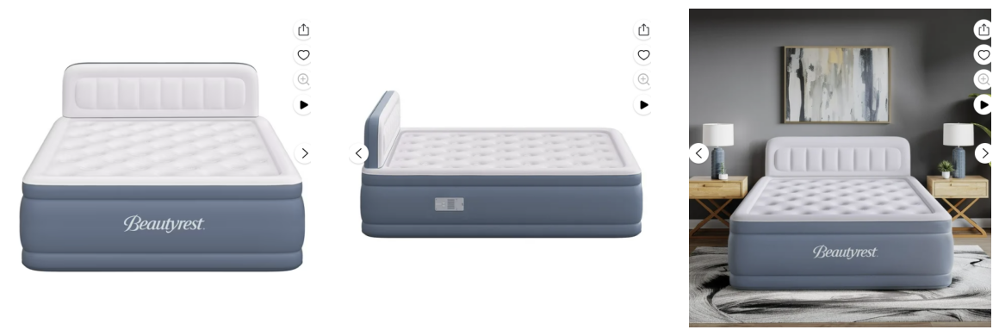

Recontext took 14.43s


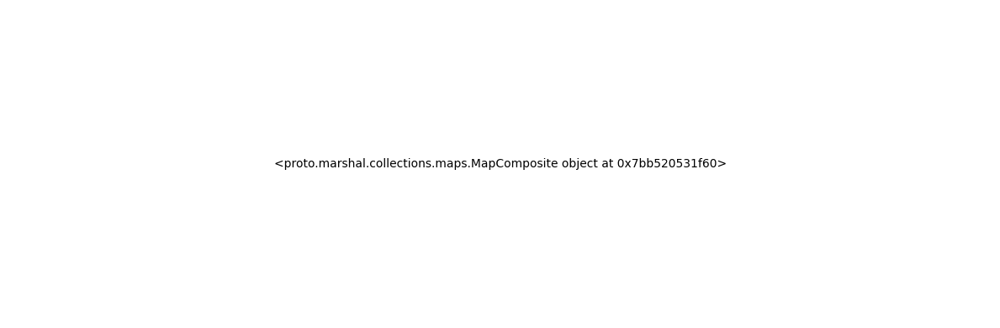

Recontext took 13.50s
Recontext took 13.77s
Saved local: product_1_output_0.jpg


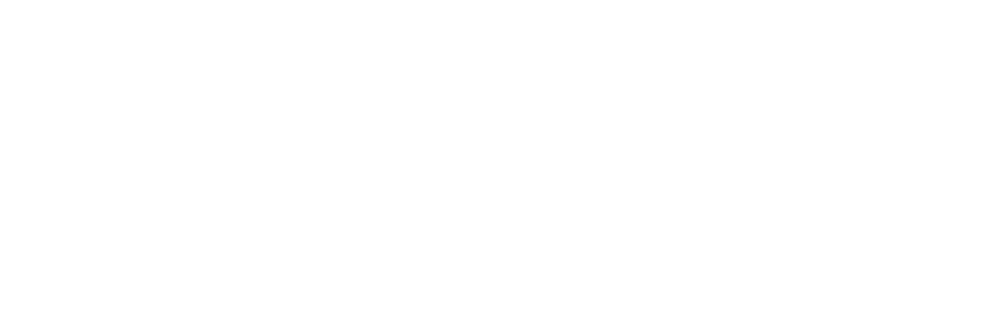

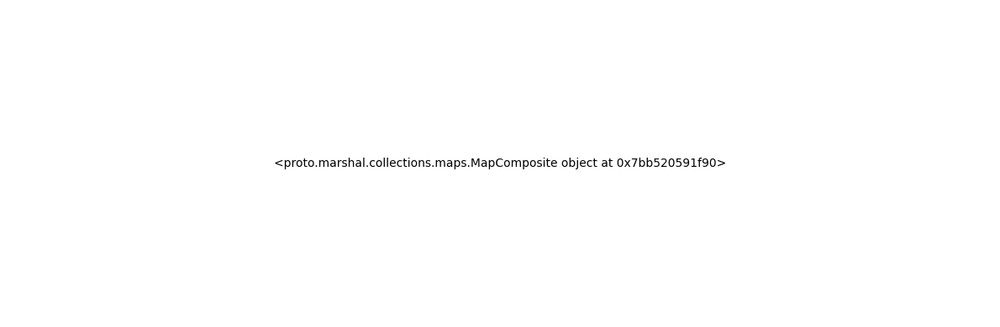

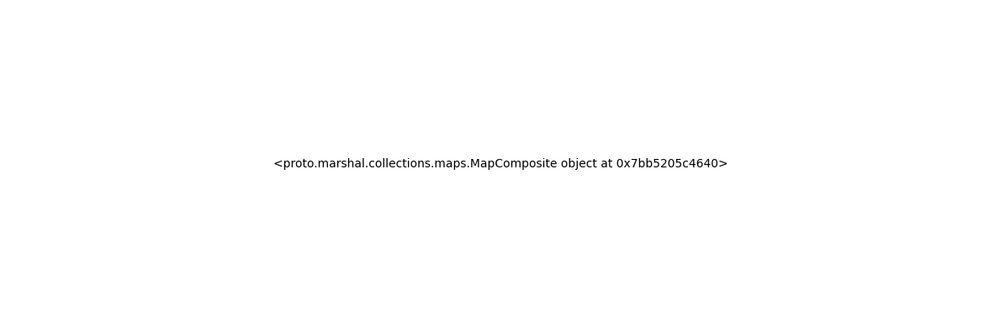

Saved local: product_10_output_0.jpg
Recontext took 14.43s
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_1/product_1_output_0.jpg

=== Processing product_15 ===
Saved local: product_13_output_0.jpg


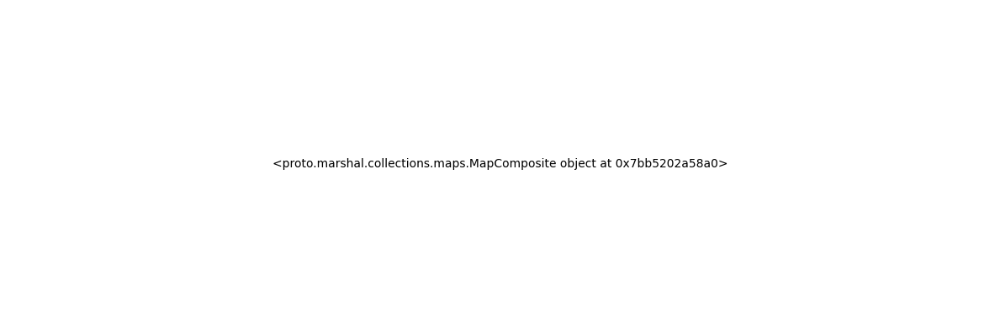

Saved local: product_12_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_10/product_10_output_0.jpg

=== Processing product_16 ===
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_13/product_13_output_0.jpg

=== Processing product_17 ===
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_12/product_12_output_0.jpg

=== Processing product_18 ===


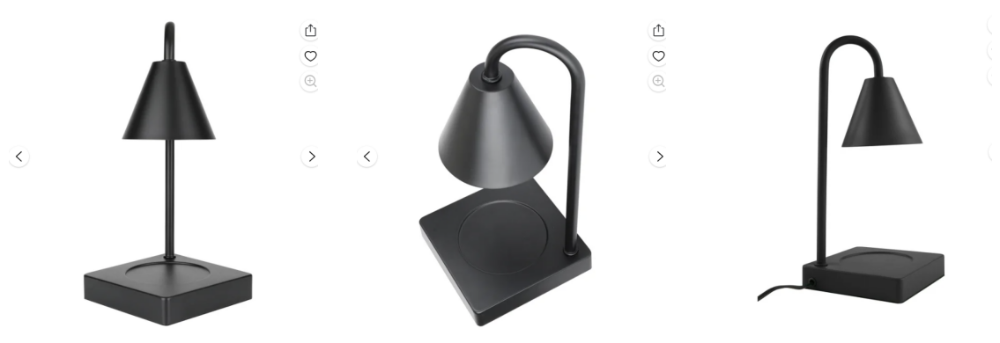

<Figure size 640x480 with 0 Axes>

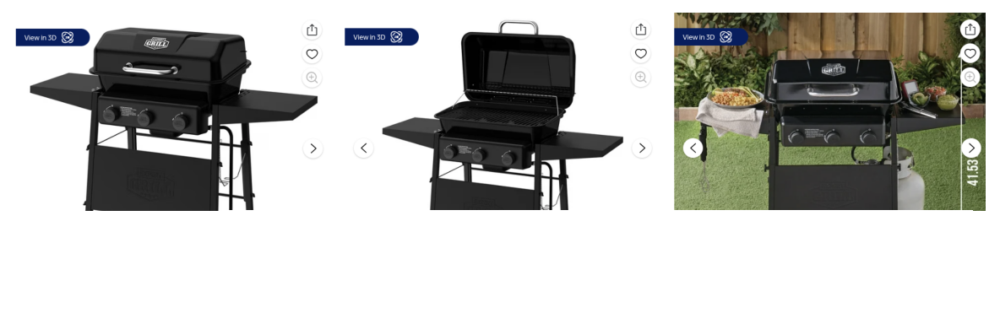

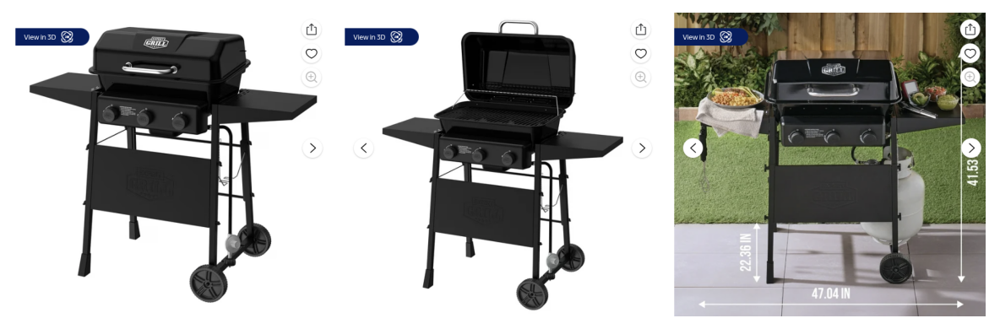

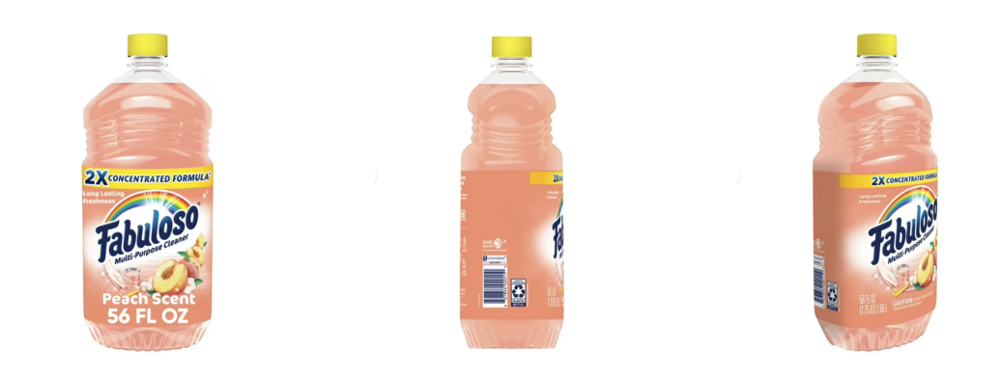

Prompt: A large, rectangular inflatable air mattress with a built-in headboard, featuring a two-tone design with a dark blue base and a white top sleeping surface. The headboard is also white with vertical channeled sections. The top surface has a quilted, dimpled pattern for comfort. The 'Beautyrest' logo is prominently displayed in white script on the dark blue base. The air mattress is placed in a modern guest bedroom with light grey walls, light wood flooring, and minimalist decor. There is a large window with sheer white curtains allowing soft natural light to illuminate the room. A small, round side table with a simple vase of fresh flowers is next to the bed.
Desc:   A large, rectangular inflatable air mattress with a built-in headboard, featuring a two-tone design with a dark blue base and a white top sleeping surface. The headboard is also white with vertical channeled sections. The top surface has a quilted, dimpled pattern for comfort. The 'Beautyrest' logo is prominently di

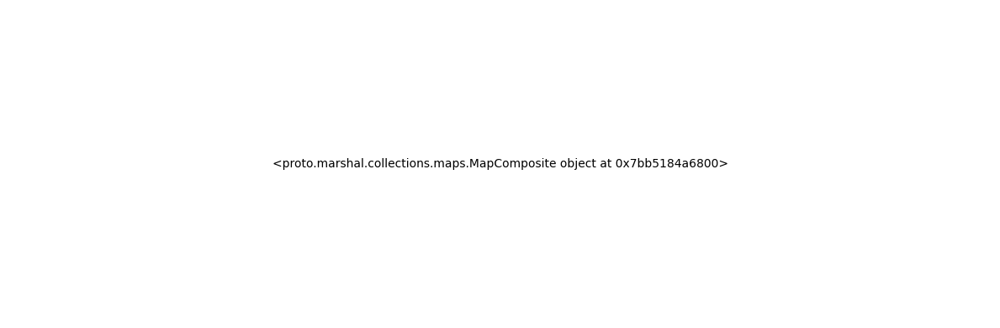

Saved local: product_15_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_15/product_15_output_0.jpg

=== Processing product_19 ===
Recontext took 13.64s


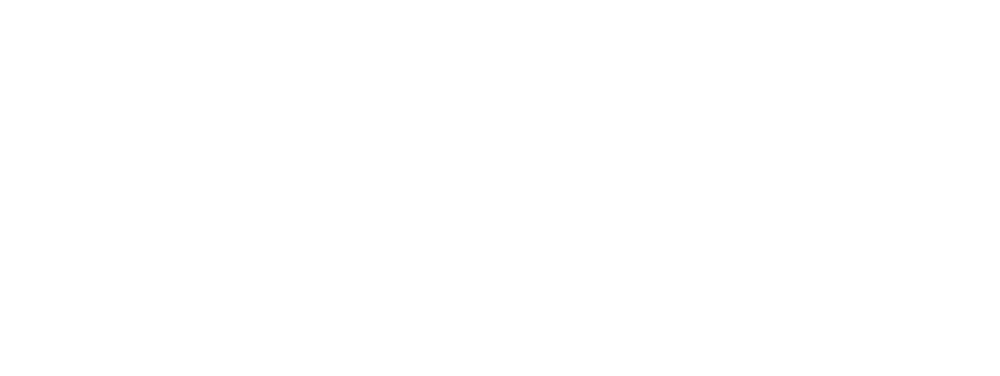

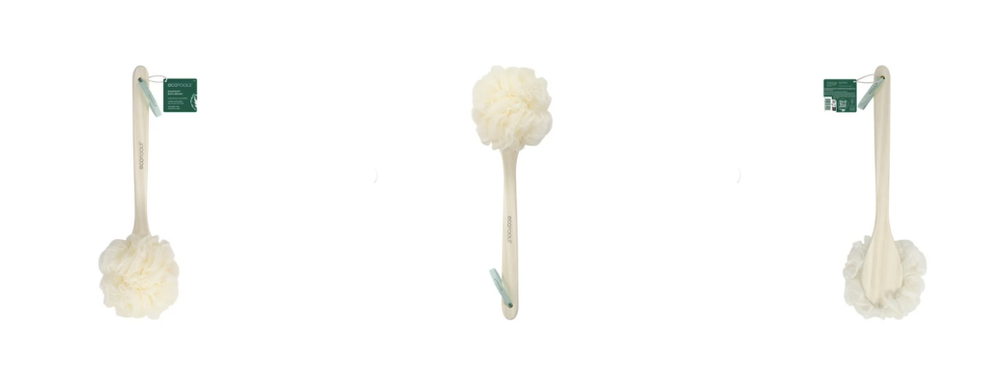

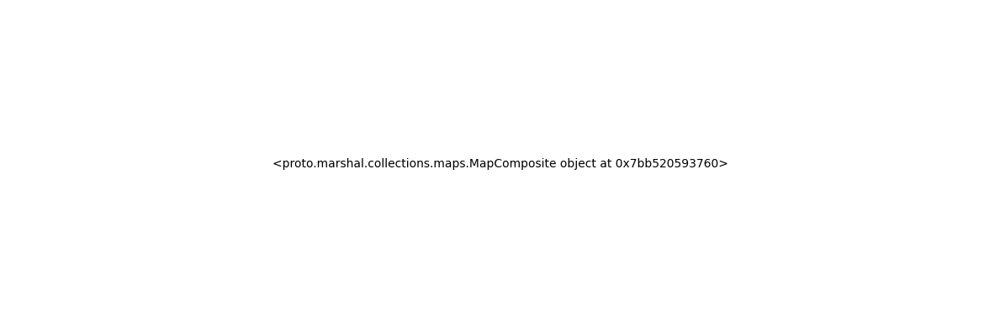

Saved local: product_14_output_0.jpg
Recontext took 11.57s


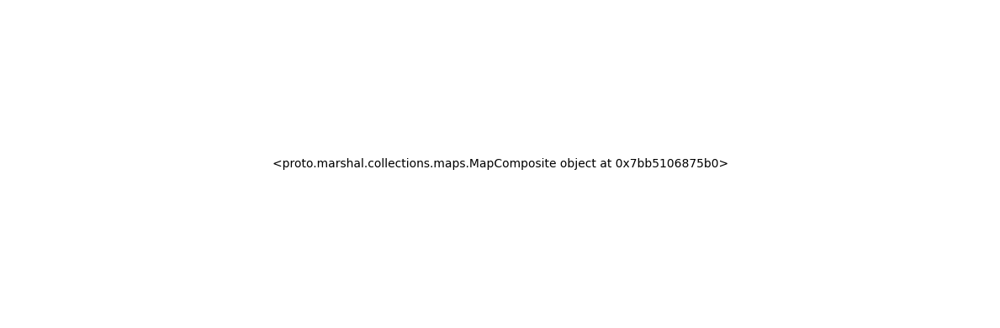

Uploaded to gs://id_test_bucket/walmart/product_images_output/product_14/product_14_output_0.jpg

=== Processing product_2 ===
Saved local: product_17_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_17/product_17_output_0.jpg

=== Processing product_20 ===
Recontext took 13.83s


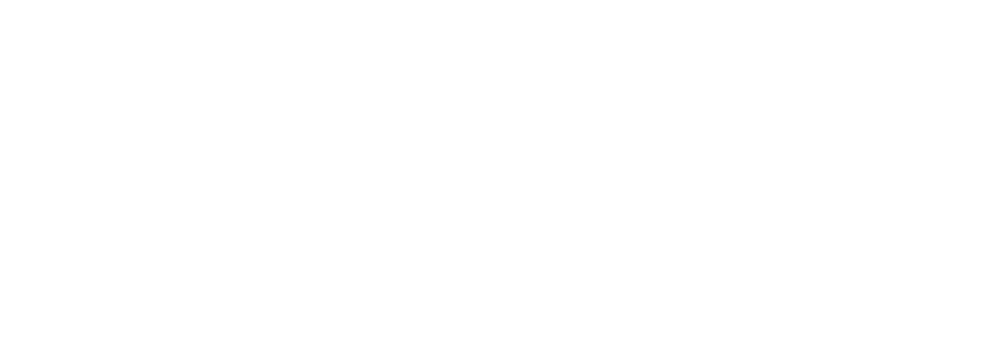

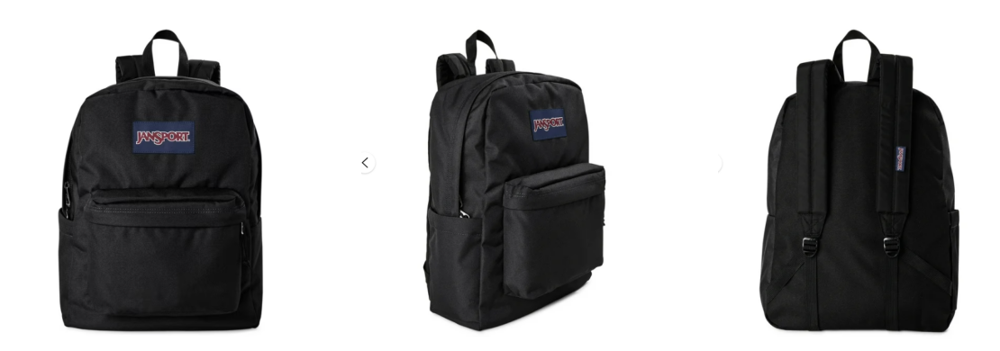

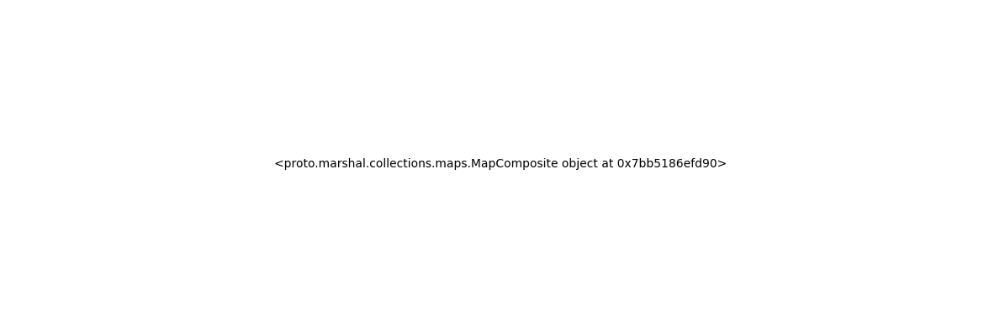

Recontext took 12.77s


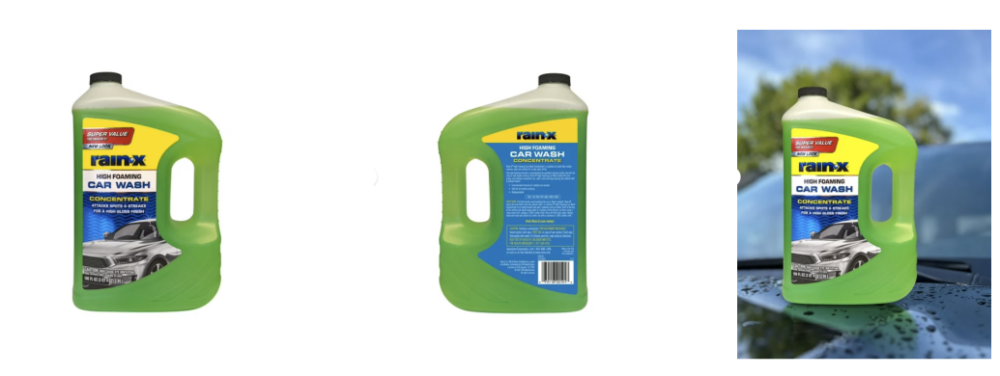

<Figure size 640x480 with 0 Axes>

Saved local: product_18_output_0.jpg
Saved local: product_16_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_18/product_18_output_0.jpg

=== Processing product_3 ===
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_16/product_16_output_0.jpg

=== Processing product_4 ===


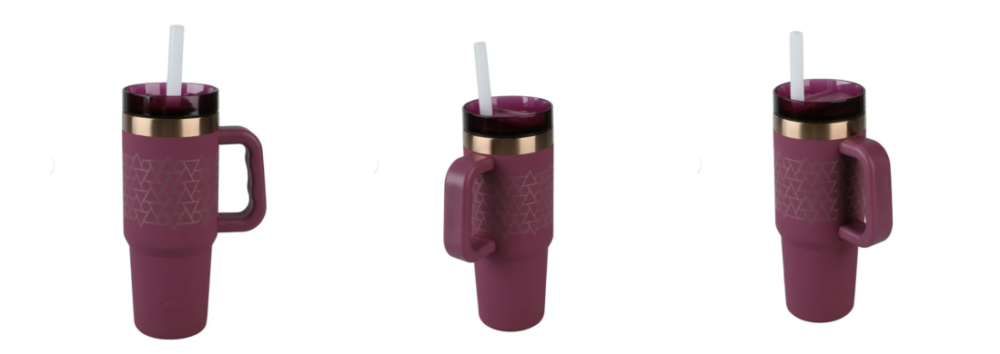

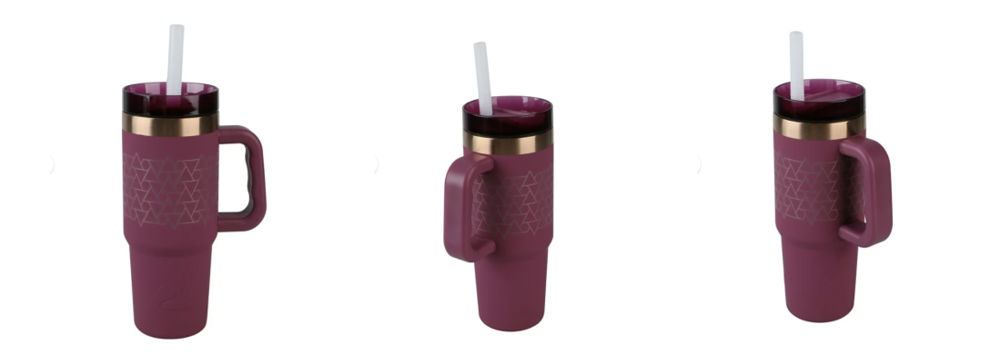

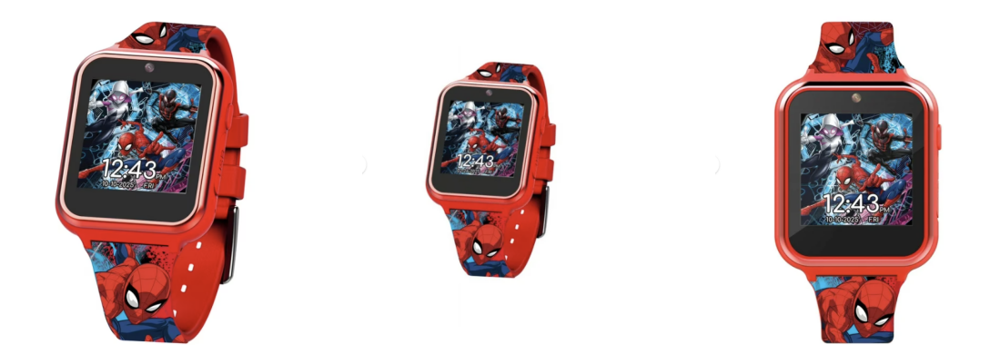

Prompt: A long-handled bath brush with a light beige wooden handle and a fluffy, cream-colored mesh loofah head, designed for exfoliating and cleansing. The handle is smooth and slightly curved for ergonomic grip, with the brand name 'ecotools' subtly debossed along its length. The loofah head is full and soft, made of a fine mesh material. The brush is hanging on a sleek, minimalist towel rack in a modern, spa-like bathroom with white subway tiles, a large freestanding tub, and soft, diffused natural light coming through a frosted window.
Desc:   A long-handled bath brush with a light beige wooden handle and a fluffy, cream-colored mesh loofah head, designed for exfoliating and cleansing. The handle is smooth and slightly curved for ergonomic grip, with the brand name 'ecotools' subtly debossed along its length. The loofah head is full and soft, made of a fine mesh material.
Prompt: A classic black JanSport backpack, made of durable polyester fabric with a slightly textured finish. It

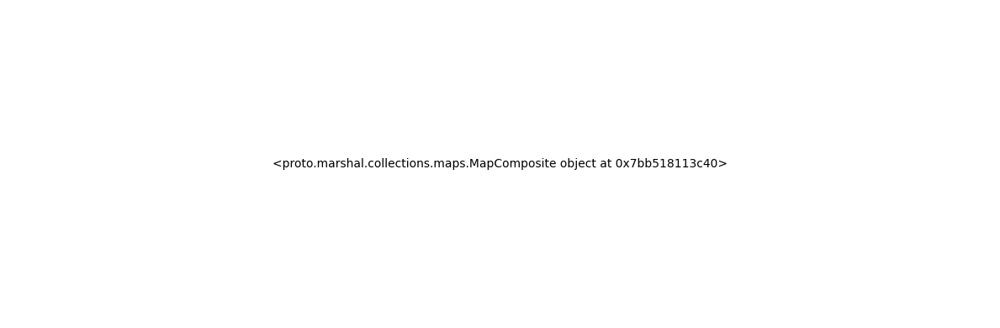

Saved local: product_19_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_19/product_19_output_0.jpg

=== Processing product_5 ===


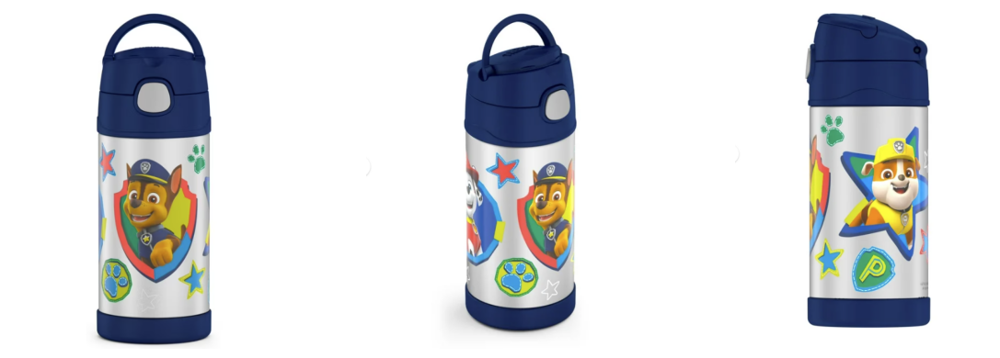

Recontext took 10.82s


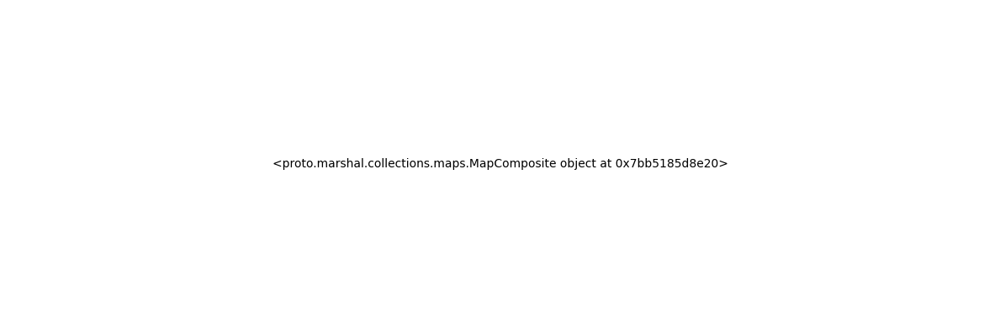

Saved local: product_4_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_4/product_4_output_0.jpg

=== Processing product_6 ===


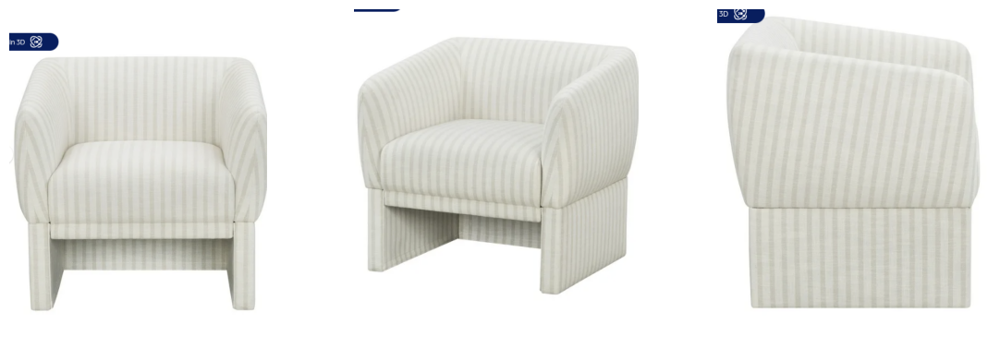

Prompt: A stainless steel water bottle with a dark blue top and base, featuring a vibrant 'Paw Patrol' character graphic wrap-around design. The design includes various characters like Chase, Marshall, and Rubble, along with colorful stars and paw prints, set against a metallic silver background. The bottle has a dark blue flip-top lid with a push-button release and an integrated carrying handle. The bottle is placed on a picnic blanket in a sunny park, surrounded by green grass and a few scattered toys like a small red ball and a yellow frisbee, suggesting a playful outdoor setting.
Desc:   A stainless steel water bottle with a dark blue top and base, featuring a vibrant 'Paw Patrol' character graphic wrap-around design. The design includes various characters like Chase, Marshall, and Rubble, along with colorful stars and paw prints, set against a metallic silver background. The bottle has a dark blue flip-top lid with a push-button release and an integrated carrying handle.
Recontext

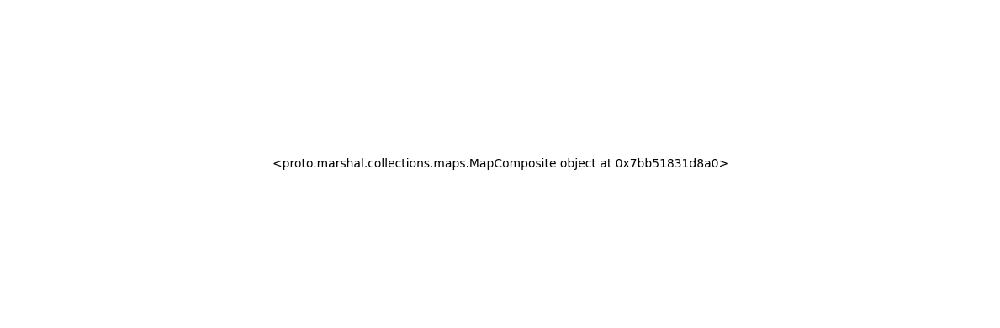

Saved local: product_2_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_2/product_2_output_0.jpg

=== Processing product_7 ===


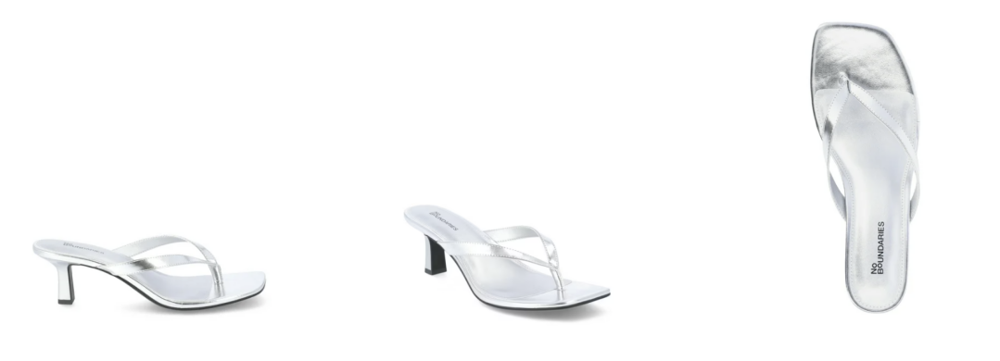

Recontext took 13.74s


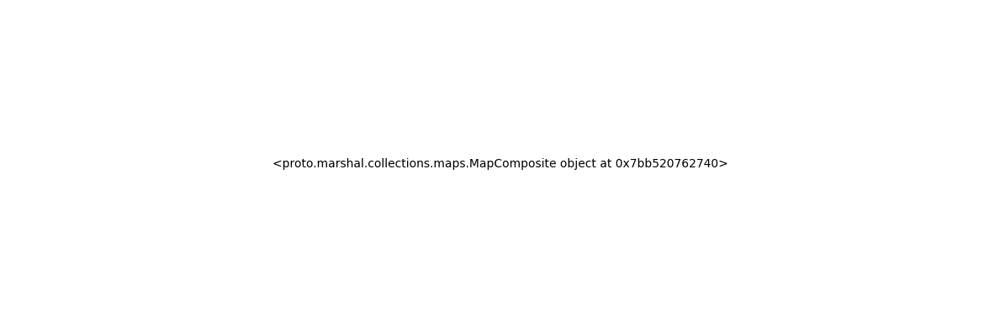

Saved local: product_20_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_20/product_20_output_0.jpg

=== Processing product_8 ===


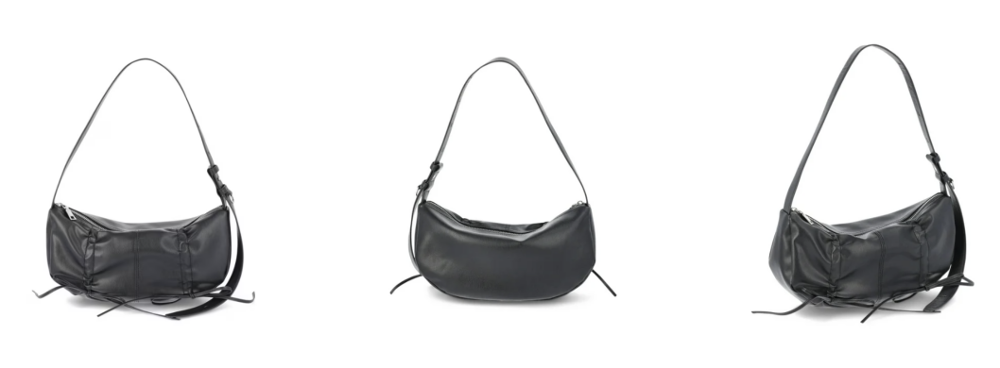

Prompt: A contemporary club chair upholstered in a light cream fabric with subtle vertical grey stripes, featuring a rounded back and arms that flow seamlessly into the seat, and a solid, block-like base. The chair is placed in a minimalist living room with natural light streaming through large windows, showcasing light oak wood flooring and a simple, textured rug. A small, round side table with a ceramic vase holding a single dried pampas grass stem is positioned next to the chair.
Desc:   A contemporary club chair upholstered in a light cream fabric with subtle vertical grey stripes, featuring a rounded back and arms that flow seamlessly into the seat, and a solid, block-like base.
Recontext took 15.84s


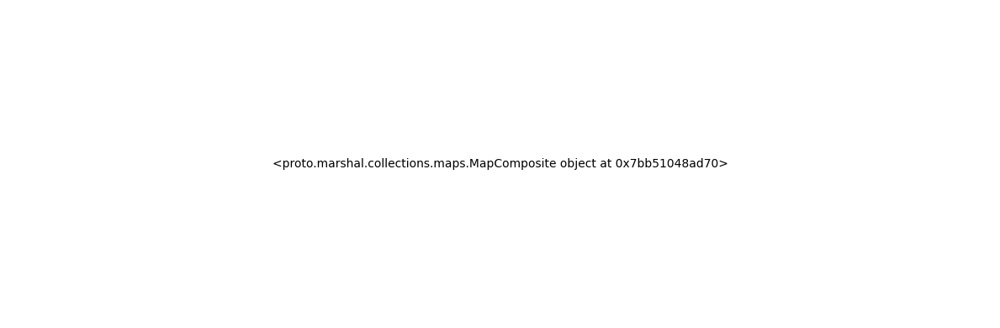

Error processing batch product_3: 'bytesBase64Encoded'

=== Processing product_9 ===
Prompt: A sleek, black faux leather shoulder bag with a crescent moon shape and a ruched, gathered body, featuring a silver-toned zipper closure and an adjustable strap, resting on a minimalist concrete bench in a modern urban park setting with soft, diffused natural light.
Desc:   A sleek, black faux leather shoulder bag with a crescent moon shape and a ruched, gathered body, featuring a silver-toned zipper closure and an adjustable strap.


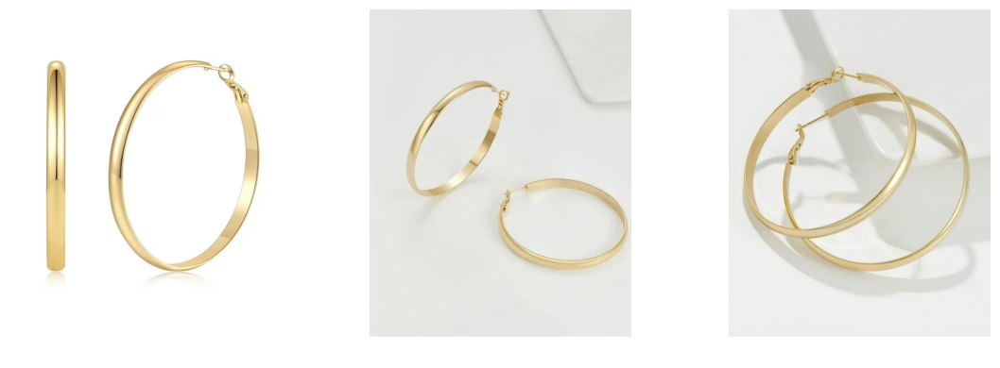

Prompt: A single silver metallic high-heeled thong sandal with a square toe and a slender, flared heel, resting on a polished concrete floor in a minimalist, sunlit art gallery with large windows and subtle architectural details.
Desc:   A single silver metallic high-heeled thong sandal with a square toe and a slender, flared heel.
Prompt: A pair of classic, polished gold-tone hoop earrings with a flat, wide band and a smooth, reflective surface, featuring a simple hinge closure. The earrings are elegantly displayed on a vanity table in a chic, minimalist bedroom, with soft, natural light illuminating them, alongside a delicate silk scarf and a small, ornate perfume bottle.
Desc:   A pair of classic, polished gold-tone hoop earrings with a flat, wide band and a smooth, reflective surface, featuring a simple hinge closure.
Recontext took 11.90s


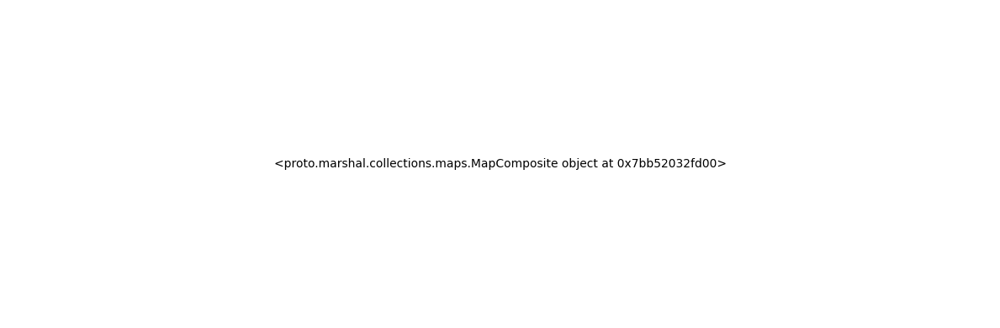

Saved local: product_5_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_5/product_5_output_0.jpg
Recontext took 10.43s


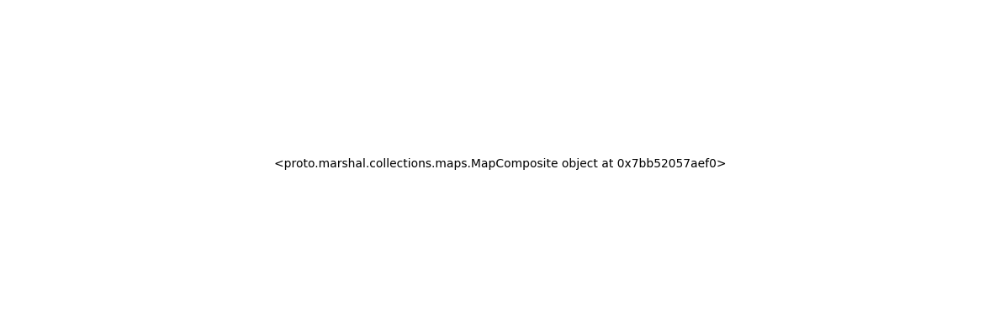

Saved local: product_8_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_8/product_8_output_0.jpg
Recontext took 13.51s


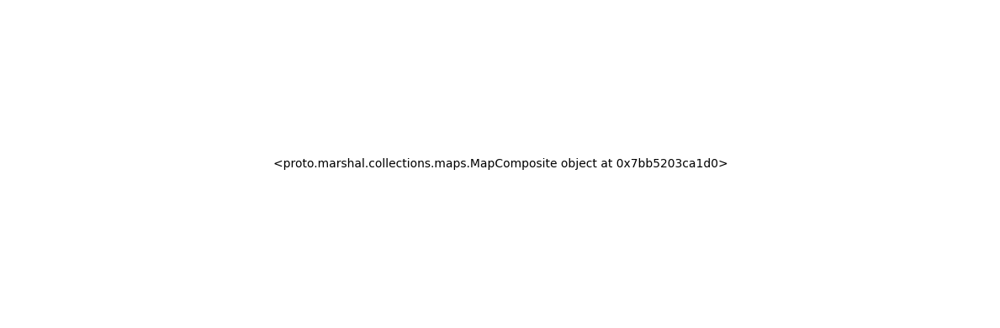

Saved local: product_6_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_6/product_6_output_0.jpg
Recontext took 10.94s


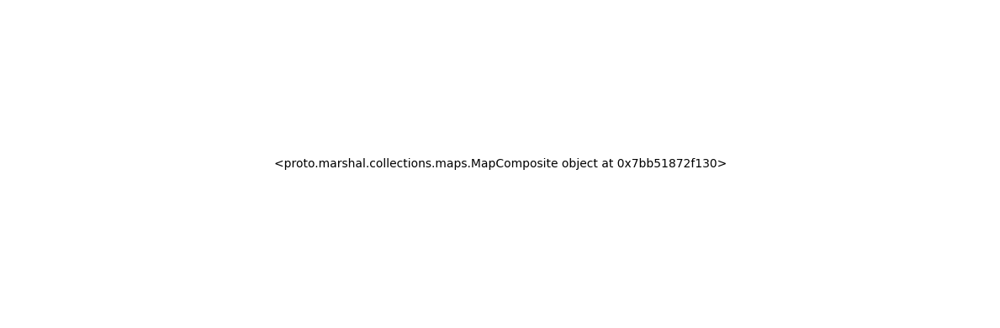

Saved local: product_9_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_9/product_9_output_0.jpg
Recontext took 16.97s


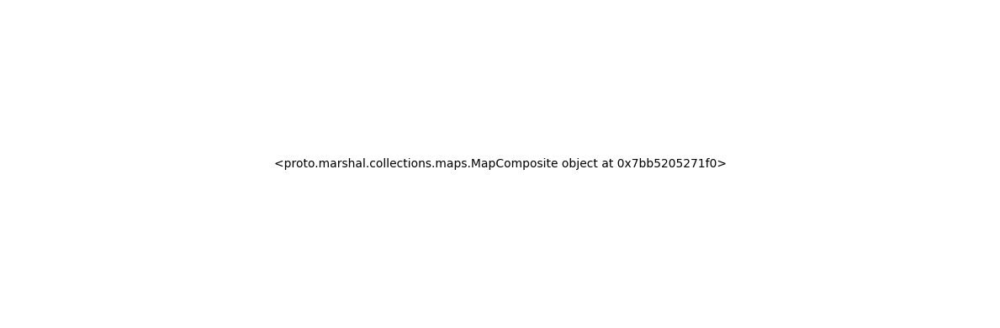

Saved local: product_7_output_0.jpg
Uploaded to gs://id_test_bucket/walmart/product_images_output/product_7/product_7_output_0.jpg

Process completed at: 2025-07-30 15:24:13
Total time taken: 0:01:16.258319


In [17]:
# Parallel threads

import concurrent.futures
from datetime import datetime  # <-- Added
import io
from PIL import Image

INPUT_PREFIX = "gs://id_test_bucket/walmart/product_images_input"
OUTPUT_BUCKET = "id_test_bucket"
MAX_WORKERS = 5  # Adjust this to control parallelism

# Start time
start_time = datetime.now()
print(f"\n🔄 Process started at: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")

batches = list(discover_product_batches(INPUT_PREFIX))
print(f"\nTotal product folders discovered: {len(batches)}")

if not batches:
    raise RuntimeError("No product batches found—check your GCS path & permissions!")

def process_batch(batch):
    try:
        print(f"\n=== Processing {batch['product_folder']} ===")

        # Preview
        imgs = [Image.open(io.BytesIO(download_gcs_image_bytes(u))) for u in batch["product_uris"]]
        display_row(imgs)

        # Generate prompt & description
        gen = generate(batch["image_parts"])
        print("Prompt:", gen["Prompt"])
        print("Desc:  ", gen["product_description"])

        # Recontextualize
        resp = call_product_recontext(
            prompt=gen["Prompt"],
            product_description=gen["product_description"],
            image_uris_list=batch["product_uris"],
            disable_prompt_enhancement=False,
            sample_count=1,
            safety_setting="block_low_and_above",
            person_generation="allow_adult",
        )

        # Display & upload
        preds = list(resp.predictions)
        display_row(preds)
        for i, p in enumerate(preds):
            save_and_upload_recontext_image(
                p,
                batch["product_folder"],
                OUTPUT_BUCKET,
                image_index=i
            )
    except Exception as e:
        print(f"Error processing batch {batch['product_folder']}: {e}")

# Parallel execution
with concurrent.futures.ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
    futures = [executor.submit(process_batch, batch) for batch in batches]
    concurrent.futures.wait(futures)

# End time
end_time = datetime.now()
duration = end_time - start_time
print(f"\nProcess completed at: {end_time.strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Total time taken: {duration}")
